In [166]:
import polars as pl
import numpy as np
from typing import List

def diff_expr(col: str, lag: int = 1) -> pl.Expr:
    return (pl.col(col) - pl.col(col).shift(lag)).alias(f"{col}_diff_{lag}")

def second_order_diff_expr(col: str, lag: int = 1) -> pl.Expr:
    # 二阶差分 = 一阶差分的差分
    first_diff = pl.col(col) - pl.col(col).shift(lag)
    second_diff = first_diff - first_diff.shift(lag)
    return second_diff.alias(f"{col}_second_order_diff_{lag}")

def momentum_ratio_expr(col: str, lag: int = 200) -> pl.Expr:
    # 动量比率 = x_t / x_{t-lag}
    return (pl.col(col) / (pl.col(col).shift(lag) + 1e-8)).alias(f"{col}_momentum_ratio_{lag}")

def rolling_volatility_expr(col: str, window: int) -> pl.Expr:
    return pl.col(col).rolling_std(window).alias(f"{col}_volatility_{window}")

def lag_exprs(col: str, lags: List[int]) -> List[pl.Expr]:
    return [
        pl.col(col).shift(lag).alias(f"{col}_lag_{lag}")
        for lag in lags
    ]


def cross_comb_expr(a: str, b: str) -> pl.Expr:
    return (pl.col(a) + (pl.col(b) + 1e-8)).alias(f"{a}_comb_{b}")

def cols_to_transforms(
        df: pl.DataFrame,
        exclude_cols: List[str] = None
) -> List[str]:
    if exclude_cols is None:
        exclude_cols = ['px', 'timestamp', 'timestamp_dt', 'symbol']

    if isinstance(df, pl.LazyFrame):
        cols = df.collect_schema().names()
    else:
        cols = df.columns

    cols = [
        col for col in cols
        if col not in exclude_cols and not (
                col.endswith('_rolling_mean') or
                col.endswith('_rolling_std') or
                col.endswith('_scaled')
        )
    ]

    return cols

def batch_apply_single_exprs(
        window: int,
        lag: int,
        cols: List[str] = None
) -> List[str]:
    single_exprs = []
    # single features transformation
    for col in cols:
        single_exprs.extend([
            diff_expr(col),
            second_order_diff_expr(col),
            momentum_ratio_expr(col, lag),
            rolling_volatility_expr(col, window),
        ])
        # single_exprs.extend(lag_exprs(col, [10, 20, 50, 100, 200]))

    return single_exprs

def batch_apply_multi_exprs(
        cols: List[str] = None
) -> List[str]:
    multi_exprs = []

    n = len(cols)
    for i in range(n):
        for j in range(i + 1, n):
            a, b = cols[i], cols[j]
            multi_exprs.extend([
                cross_comb_expr(a, b),
            ])

    return multi_exprs

def batch_apply_transforms(
        df_to_transforms: pl.DataFrame,
        window: int,
        lag: int,
        exclude_cols: List[str] = None
) -> pl.DataFrame:
    base_cols = cols_to_transforms(df_to_transforms, exclude_cols)
   
    single_exprs = batch_apply_single_exprs(window, lag, base_cols)
    multi_exprs = batch_apply_multi_exprs(base_cols)

    exprs = single_exprs + multi_exprs
    return df_to_transforms.with_columns(single_exprs)



In [168]:
import polars as pl
import numpy as np
from typing import List
from tqdm import tqdm

def split_df_by_week(
        origin_input_df: pl.DataFrame,
        ts_col: str = "timestamp"
) -> List[pl.DataFrame]:
    origin_input_df = origin_input_df.with_columns([
        pl.col(ts_col).cast(pl.Datetime).alias(f"{ts_col}_dt")
    ])

    origin_input_df = origin_input_df.with_columns([
        pl.col(f"{ts_col}_dt").dt.truncate("1w").alias("week_start")
    ])

    unique_weeks = origin_input_df.select("week_start").unique().sort("week_start")

    weekly_dfs = [
        origin_input_df.filter(pl.col("week_start") == wk).drop("week_start")
        for wk in unique_weeks["week_start"]
    ]

    return weekly_dfs


def clean_df_drop_nulls(
        df_to_clean: pl.DataFrame,
        null_threshold: int = 10000,
        verbose: bool = True
) -> pl.DataFrame:
    pd_df = df_to_clean.to_pandas()

    null_counts = pd_df.isnull().sum()
    cols_to_drop = null_counts[null_counts > null_threshold].index

    pd_df_cleaned = pd_df.drop(columns=cols_to_drop)
    pd_df_clean = pd_df_cleaned.dropna()
    pl_df_clean = pl.from_pandas(pd_df_clean)

    if verbose:
        max_null_col = null_counts.idxmax()
        max_null_count = null_counts.max()
        print("各列空值数量：")
        print(null_counts[null_counts > 0])
        print(f"删除空值超过 {null_threshold} 的列：{list(cols_to_drop)}")
        print(f"删除列后，DataFrame形状：{pd_df_cleaned.shape}")
        print(f"空值最多的列是：{max_null_col}，共有 {max_null_count} 个空值")
        print(f"删除空值行后，DataFrame形状：{pd_df_clean.shape}")

    return pl_df_clean

def avg_steps_to_volatility(prices: np.ndarray, target_ratio: float) -> int:
    n = len(prices)
    steps_list = []
    for i in tqdm(range(n), desc=f"cal abs change {target_ratio*100:.2f}% avg steps"):
        start_price = prices[i]
        steps = -1
        for j in range(i + 1, n):
            change = abs(prices[j] / start_price - 1)
            if change >= target_ratio:
                steps = j - i
                break
        if steps != -1:
            steps_list.append(steps)
    if len(steps_list) == 0:
        return -1
    return int(np.mean(steps_list))

def future_return_expr(price_col: str, step: int) -> pl.Expr:
    return ((pl.col(price_col).shift(-step) - pl.col(price_col)) / pl.col(price_col)).alias(f"future_return_{step}")

def rolling_minmax_scaled_expr(
        col: str,
        min_col: str,
        max_col: str,
        scaled_col: str
) -> pl.Expr:
    return (
        ((pl.col(col) - pl.col(min_col)) / (pl.col(max_col) - pl.col(min_col) + 1e-9))
        .clip(0.0, 1.0)
        .fill_null(0.5)
        .alias(scaled_col)
    )

def rolling_minmax_normalize(rollin_df: pl.DataFrame, window: int) -> pl.DataFrame:
    columns_to_normalize = [
        col for col in rollin_df.columns
        if col not in ['px', 'timestamp', 'timestamp_dt', 'symbol']
           and not col.startswith("future_return_")
           and not col.endswith('_scaled')  # scaled 是最终产物，保留
           and not (
                col.endswith('_rolling_mean') or
                col.endswith('_rolling_std') or
                col.endswith('_rolling_max') or
                col.endswith('_rolling_min')
        )
    ]

    rolling_cols = []
    for column in columns_to_normalize:
        rolling_cols.extend([
            pl.col(column).rolling_max(window, min_samples=1).alias(f"{column}_rolling_max"),
            pl.col(column).rolling_min(window, min_samples=1).alias(f"{column}_rolling_min"),
        ])

    intermediate_cols = [
                            f"{column}_rolling_max" for column in columns_to_normalize
                        ] + [
                            f"{column}_rolling_min" for column in columns_to_normalize
                        ]

    return (
        rollin_df
        .with_columns(rolling_cols)
        .with_columns([
            rolling_minmax_scaled_expr(
                col=column,
                min_col=f"{column}_rolling_min",
                max_col=f"{column}_rolling_max",
                scaled_col=f"{column}_scaled"
            ) for column in columns_to_normalize
        ])
        .drop(intermediate_cols)
    )

def rolling_mean_tanh_scaled_expr(
        col: str,
        scaled_col: str,
        window: int
) -> pl.Expr:
    return (
        pl.col(col)
        .rolling_mean(window, min_samples=1)
        .tanh()
        .rolling_mean(window, min_samples=1)
        .alias(scaled_col)
    )

def rolling_mean_tanh_normalize(rollin_df: pl.DataFrame, window: int) -> pl.DataFrame:
    columns_to_normalize = [
        col for col in rollin_df.columns
        if col not in ['px', 'timestamp', 'timestamp_dt', 'symbol']
           and not col.startswith("future_return_")
           and not col.endswith('_scaled')
    ]

    return rollin_df.with_columns([
        rolling_mean_tanh_scaled_expr(
            col=column,
            scaled_col=f"{column}_scaled",
            window=window
        ) for column in columns_to_normalize
    ])

def rolling_ic_ir_icto_index(
        df: pl.DataFrame,
        target_col: str,
        exclude_prefixes: list[str],
        window_size: int,
        step: int = 1,
) -> pl.DataFrame:
    feature_cols = [
        col for col in df.columns
        if col.endswith("_scaled") 
            and col.startswith("z_") 
            and all(not col.startswith(prefix) for prefix in exclude_prefixes)
            and not col.startswith("future_return_")
            and col != "px"
    ]

    # feature_cols = [
    #     col for col in df.columns
    #     if col.startswith("z_") 
    #         and all(not col.startswith(prefix) for prefix in exclude_prefixes)
    #         and not col.startswith("future_return_")
    #         and col != "px"
    # ]

    n = df.height
    results = []
    prev_ranks = {}

    for start in tqdm(range(0, n - window_size + 1, step), desc="Rolling IC & ICTO"):
        end = start + window_size
        df_win = df.slice(start, window_size)

        # rank 转换
        df_ranked = df_win.with_columns([
            (pl.col(c).rank(method="average") / window_size).alias(c + "_rank") for c in feature_cols + [target_col]
        ])
        target_rank_col = target_col + "_rank"

        for feat in feature_cols:
            feat_rank_col = feat + "_rank"
            ic = df_ranked.select(
                pl.corr(pl.col(feat_rank_col), pl.col(target_rank_col)).alias("ic")
            ).to_series()[0]

            turnover = None
            if feat in prev_ranks:
                cur_ranks = df_ranked[feat_rank_col].to_numpy()
                prev = prev_ranks[feat]
                if len(prev) == len(cur_ranks):
                    turnover = np.mean(np.abs(cur_ranks - prev))

            # 更新 prev_ranks
            prev_ranks[feat] = df_ranked[feat_rank_col].to_numpy()

            results.append({
                "window_start": int(start),
                "window_end": int(end - 1),
                "factor": str(feat),
                "ic": float(ic) if not np.isnan(ic) else None,
                "turnover": float(turnover) if turnover is not None else None
            })

    df_result = pl.DataFrame(
        results,
        schema={
            "window_start": pl.Int64,
            "window_end": pl.Int64,
            "factor": pl.Utf8,
            "ic": pl.Float64,
            "turnover": pl.Float64,
        }
    )      
    return (
        df_result
        .group_by("factor")
        .agg([
            pl.mean("ic").alias("mean_ic"),
            pl.std("ic").alias("std_ic"),
            pl.mean("turnover").alias("mean_turnover")
        ])
        .with_columns([
            (pl.col("mean_ic") / pl.col("std_ic")).alias("ir"),
            (pl.col("mean_ic") / (pl.col("mean_turnover") + 1e-8)).abs().alias("icto")
        ])
        .sort("icto", descending=True)
    )

In [170]:
origin_df = pl.read_csv("C:/quant/data/binance_resampled_data/BTCUSDT_factors_threshold0.001_rolling200.csv")
print(origin_df)
origin_df = batch_apply_transforms(origin_df, 200, 1)


shape: (27_214, 115)
┌──────────────────┬──────────┬────────────┬─────────────┬───┬─────────────────────┬────────────────────┬────────────────────┬────────────────────┐
│ timestamp        ┆ px       ┆ sum_buy_sz ┆ sum_sell_sz ┆ … ┆ z_factor_momentum_t ┆ z_factor_order_sen ┆ z_factor_oi_moment ┆ z_factor_oi_moment │
│ ---              ┆ ---      ┆ ---        ┆ ---         ┆   ┆ rend_confir…        ┆ timent_diver…      ┆ um_punch           ┆ um_long_term…      │
│ i64              ┆ f64      ┆ f64        ┆ f64         ┆   ┆ ---                 ┆ ---                ┆ ---                ┆ ---                │
│                  ┆          ┆            ┆             ┆   ┆ f64                 ┆ f64                ┆ f64                ┆ f64                │
╞══════════════════╪══════════╪════════════╪═════════════╪═══╪═════════════════════╪════════════════════╪════════════════════╪════════════════════╡
│ 1744003134974000 ┆ 77116.4  ┆ 41.241     ┆ 18.209      ┆ … ┆ 0.759049            ┆ -0.668

In [188]:
avg_steps_pct = 200

origin_df = origin_df.with_columns([
    future_return_expr("px", avg_steps_pct),
])
print(origin_df)

origin_df = rolling_mean_tanh_normalize(origin_df, 200)
origin_df = clean_df_drop_nulls(origin_df)

weekly_dataframes = split_df_by_week(origin_df)
print("num weekly dfs: ", len(weekly_dataframes))

shape: (26_815, 568)
┌──────────────────┬──────────┬────────────┬─────────────┬───┬─────────────────────┬─────────────────────┬────────────────────┬───────────────────┐
│ timestamp        ┆ px       ┆ sum_buy_sz ┆ sum_sell_sz ┆ … ┆ z_factor_oi_momentu ┆ z_factor_oi_momentu ┆ z_factor_oi_moment ┆ future_return_200 │
│ ---              ┆ ---      ┆ ---        ┆ ---         ┆   ┆ m_long_term…        ┆ m_long_term…        ┆ um_long_term…      ┆ ---               │
│ i64              ┆ f64      ┆ f64        ┆ f64         ┆   ┆ ---                 ┆ ---                 ┆ ---                ┆ f64               │
│                  ┆          ┆            ┆             ┆   ┆ f64                 ┆ f64                 ┆ f64                ┆                   │
╞══════════════════╪══════════╪════════════╪═════════════╪═══╪═════════════════════╪═════════════════════╪════════════════════╪═══════════════════╡
│ 1744009518143000 ┆ 74635.7  ┆ 349.294    ┆ 155.914     ┆ … ┆ 0.63661             ┆ 10.601

In [190]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.mixture import GaussianMixture

import lightgbm as lgb
from catboost import CatBoostClassifier
import xgboost as xgb

from pytorch_tabnet.tab_model import TabNetClassifier
from sklearn.preprocessing import LabelEncoder
import torch

import numpy as np
import matplotlib.pyplot as plt

In [192]:
import matplotlib.pyplot as plt
import numpy as np

def plot_last_n_rows_with_px(y_test, y_test_binary, y_pred_prob, px, n=700):
    # 截取最后 n 行
    y_test_slice = y_test[-n:]
    y_test_binary_slice = y_test_binary[-n:]
    y_pred_prob_slice = y_pred_prob[-n:]
    px_slice = px[-n:]

    time_index = np.arange(len(y_test_slice))

    fig, ax1 = plt.subplots(figsize=(16, 7))

    # 原始收益
    ax1.plot(time_index, y_test_slice, label="Original Future Returns", color='gray', alpha=0.8)
    ax1.set_ylabel("Original Future Returns", color='gray')
    ax1.tick_params(axis='y', labelcolor='gray')

    # GMM 标签
    ax2 = ax1.twinx()
    ax2.scatter(time_index, y_test_binary_slice, label="GMM Labels", color='tab:blue', marker='o', s=20, alpha=0.7)
    ax2.set_ylabel("GMM Labels (0 or 1)", color='tab:blue')
    ax2.tick_params(axis='y', labelcolor='tab:blue')
    ax2.set_ylim(-0.1, 1.1)

    # 模型预测概率
    ax3 = ax1.twinx()
    ax3.spines.right.set_position(("outward", 60))
    ax3.plot(time_index, y_pred_prob_slice, label="MODEL Predicted Probability", color='tab:green', alpha=0.4)
    ax3.set_ylabel("MODEL Predicted Probability", color='tab:green')
    ax3.tick_params(axis='y', labelcolor='tab:green')
    ax3.set_ylim(-0.05, 1.05)

    # 加价格线 (第4轴)
    ax4 = ax1.twinx()
    ax4.spines.right.set_position(("outward", 120))  # 再右移一层
    ax4.plot(time_index, px_slice, label="Price (px)", color='tab:red', linestyle='--', alpha=0.6)
    ax4.set_ylabel("Price (px)", color='tab:red')
    ax4.tick_params(axis='y', labelcolor='tab:red')

    # x轴
    ax1.set_xlabel("Time Index")
    plt.title(f"Compare Returns, Labels, Prediction & Price (Last {n} Rows)")

    # 图例
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    lines_3, labels_3 = ax3.get_legend_handles_labels()
    lines_4, labels_4 = ax4.get_legend_handles_labels()

    ax1.legend(
        lines_1 + lines_2 + lines_3 + lines_4,
        labels_1 + labels_2 + labels_3 + labels_4,
        loc='upper left'
    )

    plt.tight_layout()
    plt.show()


In [194]:
from sklearn.mixture import GaussianMixture
import numpy as np

def gmm_label_binarize(y_train, y_val=None, y_test=None, verbose=True, random_state=42):
    """
    用 GMM 对收益率进行聚类，然后按均值高低映射为上涨(1)/下跌(0)标签。
    
    参数:
        y_train, y_val, y_test: Series 或 ndarray
        verbose: 是否打印详细映射信息
    返回:
        y_train_binary, y_val_binary, y_test_binary, gmm_model
    """
    y_train_np = np.asarray(y_train).reshape(-1, 1)
    y_val_np = np.asarray(y_val).reshape(-1, 1) if y_val is not None else None
    y_test_np = np.asarray(y_test).reshape(-1, 1) if y_test is not None else None

    # GMM 拟合
    gmm = GaussianMixture(n_components=2, random_state=random_state)
    gmm.fit(y_train_np)

    means = gmm.means_.flatten()
    upward_label = np.argmax(means)
    downward_label = np.argmin(means)

    if verbose:
        print(f"GMM 分量均值: {means}")
        print(f"上涨标签: {upward_label}, 下跌标签: {downward_label}")

    # 标签转换函数
    def transform_labels(y_np):
        raw = gmm.predict(y_np)
        binary = (raw == upward_label).astype(int)
        return binary, raw

    y_train_binary, train_raw = transform_labels(y_train_np)
    y_val_binary, val_raw = transform_labels(y_val_np) if y_val_np is not None else (None, None)
    y_test_binary, test_raw = transform_labels(y_test_np) if y_test_np is not None else (None, None)

    if verbose:
        print("\n--- GMM 原始标签 => 最终二元标签映射 ---")
        for label in [0, 1]:
            print(f"GMM 内部标签 {label} (均值: {means[label]:.6f}) => 二元标签: {1 if label == upward_label else 0}")

        print("\n--- 示例标签 ---")
        print("训练集原始收益:", y_train_np[:10].flatten())
        print("训练集GMM标签:", train_raw[:10])
        print("训练集二元标签:", y_train_binary[:10])

        if y_test_binary is not None:
            print("\n测试集原始收益:", y_test_np[:10].flatten())
            print("测试集GMM标签:", test_raw[:10])
            print("测试集二元标签:", y_test_binary[:10])

    return y_train_binary, y_val_binary, y_test_binary, gmm


In [196]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import numpy as np

def evaluate_with_confidence(
    y_true,
    y_pred_proba,                      
    model_name="Model",                    
    lower_thresh=0.15,                  
    upper_thresh=0.85,       
    print_report=True,
):

    # ===== 基础评估 (全样本) =====
    base_pred = (y_pred_proba >= 0.5).astype(int)
    base_acc = accuracy_score(y_true, base_pred)
    
    # ===== 置信预测评估 =====
    # 生成交易信号 (-1: 不交易, 0: 做空, 1: 做多)
    signals = np.full_like(y_pred_proba, fill_value=-1, dtype=int)
    signals[y_pred_proba <= lower_thresh] = 0
    signals[y_pred_proba >= upper_thresh] = 1
    
    # 计算置信预测指标
    mask = signals != -1
    conf_acc = accuracy_score(y_true[mask], signals[mask]) if any(mask) else np.nan
    trading_rate = mask.mean()
    
    # ===== 结果组织 =====
    eval_dict = {
        'model': model_name,
        'thresholds': f"{lower_thresh}-{upper_thresh}",
        'base_accuracy': base_acc,
        'confident_accuracy': conf_acc,
        'trading_rate': trading_rate,
        'conf_matrix': confusion_matrix(y_true[mask], signals[mask]) if any(mask) else None,
        'class_report': classification_report(y_true[mask], signals[mask], output_dict=True) if any(mask) else None,
        'y_test_binary': y_true, 
        'y_pred_proba': y_pred_proba, 
        'signal': signals,
    }
    
    # ===== 打印输出 =====
    if print_report:
        print(f"\n=== {model_name} 评估结果 ===")
        print(f"📊 全样本准确率: {base_acc:.4f}")
        print(f"✅ 自信预测准确率: {conf_acc:.4f} (阈值 {lower_thresh}-{upper_thresh})")
        print(f"📈 出手率: {trading_rate:.2%}")
        
        if any(mask):
            print("\n🧮 自信预测混淆矩阵:")
            print(eval_dict['conf_matrix'])
            
            print("\n📝 分类报告:")
            print(classification_report(y_true[mask], signals[mask]))
        else:
            print("⚠️ 无自信预测样本!")
    
    return eval_dict


In [198]:
def evaluate_and_plot(model, name, X_val, y_val, X_test, y_test, y_val_bin, y_test_bin, px_val, px_test):
    val_pred = model.predict_proba(X_val)[:, 1]
    test_pred = model.predict_proba(X_test)[:, 1]
    
    val_eval = evaluate_with_confidence(
        y_true=y_val_bin,
        y_pred_proba=val_pred,
        model_name=f"{name} (Val)",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_val, y_val_bin, val_pred, px_val, n=2000)

    test_eval = evaluate_with_confidence(
        y_true=y_test_bin,
        y_pred_proba=test_pred,
        model_name=f"{name} (Test)",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_test, y_test_bin, test_pred, px_test, n=2000)

    return {'val': val_eval, 'test': test_eval}


Fold 0: Train 0~3, Val 4, Test 5
Train: 2025-04-07 07:05:18.143000 to 2025-05-04 23:55:19.066000
Val: 2025-05-05 00:01:39.539000 to 2025-05-11 23:57:01.156000
Test: 2025-05-12 00:05:11.740000 to 2025-05-18 23:59:34.191000
GMM 分量均值: [-0.00490396  0.01183848]
上涨标签: 1, 下跌标签: 0

--- GMM 原始标签 => 最终二元标签映射 ---
GMM 内部标签 0 (均值: -0.004904) => 二元标签: 0
GMM 内部标签 1 (均值: 0.011838) => 二元标签: 1

--- 示例标签 ---
训练集原始收益: [0.02658111 0.02658131 0.02449089 0.02447865 0.02662336 0.02667149
 0.02454581 0.02455321 0.02454868 0.02244029]
训练集GMM标签: [1 1 1 1 1 1 1 1 1 1]
训练集二元标签: [1 1 1 1 1 1 1 1 1 1]

测试集原始收益: [ 0.00090709  0.00087642  0.00080553  0.00086105 -0.00116767  0.00086587
 -0.00116004 -0.00128587 -0.00128744 -0.00347566]
测试集GMM标签: [0 0 0 0 0 0 0 0 0 0]
测试集二元标签: [0 0 0 0 0 0 0 0 0 0]

=== lgb_model 评估结果 ===
📊 全样本准确率: 0.5338
✅ 自信预测准确率: 0.4680 (阈值 0.15-0.85)
📈 出手率: 23.82%

🧮 自信预测混淆矩阵:
[[133  53]
 [230 116]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.37      0.72    

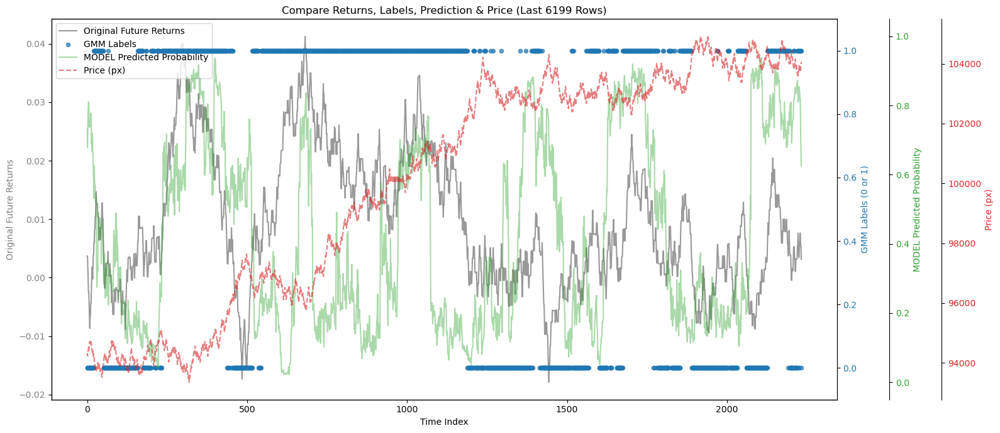


=== lgb_model 评估结果 ===
📊 全样本准确率: 0.3405
✅ 自信预测准确率: 0.4833 (阈值 0.15-0.85)
📈 出手率: 20.00%

🧮 自信预测混淆矩阵:
[[ 94 130]
 [ 87 109]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.52      0.42      0.46       224
           1       0.46      0.56      0.50       196

    accuracy                           0.48       420
   macro avg       0.49      0.49      0.48       420
weighted avg       0.49      0.48      0.48       420



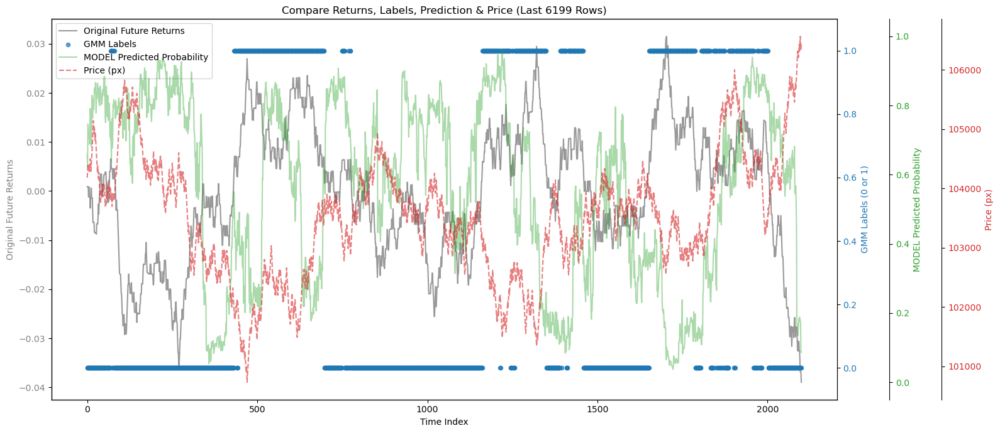


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.4702
✅ 自信预测准确率: 0.4671 (阈值 0.15-0.85)
📈 出手率: 48.32%

🧮 自信预测混淆矩阵:
[[357  74]
 [501 147]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.42      0.83      0.55       431
           1       0.67      0.23      0.34       648

    accuracy                           0.47      1079
   macro avg       0.54      0.53      0.45      1079
weighted avg       0.57      0.47      0.42      1079



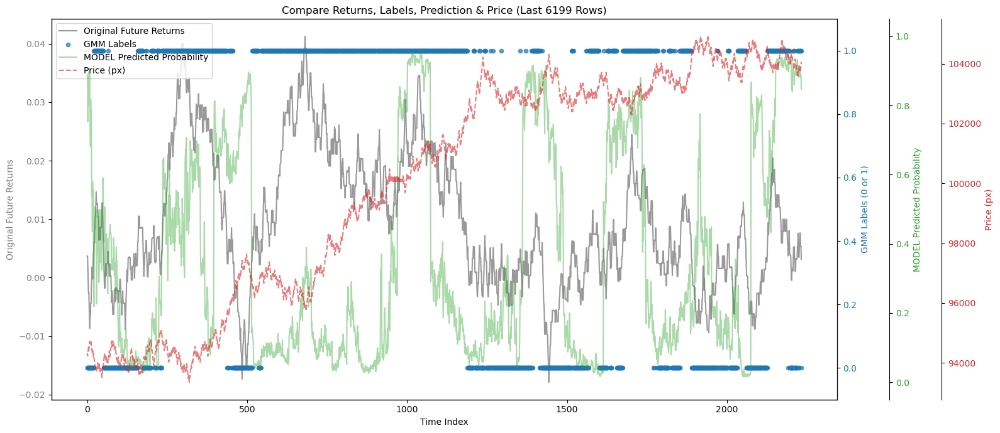


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.3624
✅ 自信预测准确率: 0.2700 (阈值 0.15-0.85)
📈 出手率: 35.10%

🧮 自信预测混淆矩阵:
[[142 370]
 [168  57]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.46      0.28      0.35       512
           1       0.13      0.25      0.17       225

    accuracy                           0.27       737
   macro avg       0.30      0.27      0.26       737
weighted avg       0.36      0.27      0.29       737



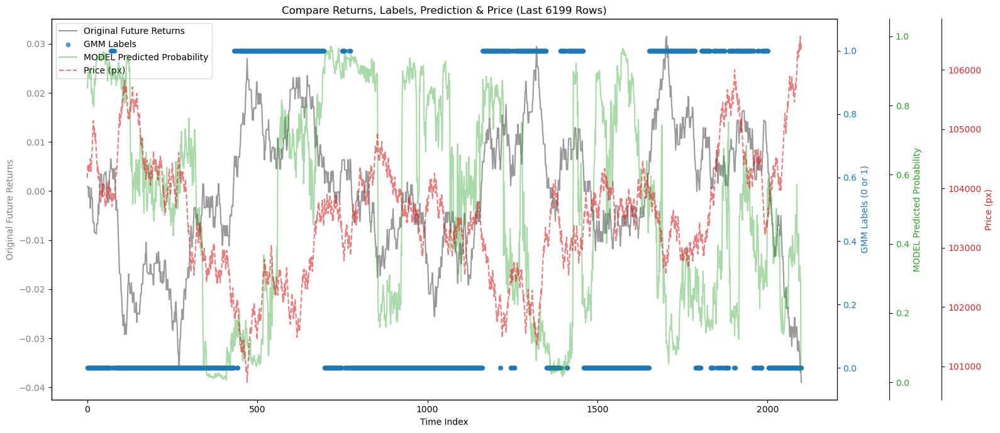

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 0.86762 | val_0_accuracy: 0.47246 |  0:00:01s
epoch 1  | loss: 0.65996 | val_0_accuracy: 0.40484 |  0:00:02s
epoch 2  | loss: 0.64161 | val_0_accuracy: 0.44604 |  0:00:04s
epoch 3  | loss: 0.57919 | val_0_accuracy: 0.41917 |  0:00:05s
epoch 4  | loss: 0.53472 | val_0_accuracy: 0.42633 |  0:00:06s
epoch 5  | loss: 0.5099  | val_0_accuracy: 0.36677 |  0:00:07s
epoch 6  | loss: 0.48864 | val_0_accuracy: 0.36991 |  0:00:08s
epoch 7  | loss: 0.45236 | val_0_accuracy: 0.44066 |  0:00:10s
epoch 8  | loss: 0.40081 | val_0_accuracy: 0.40573 |  0:00:11s
epoch 9  | loss: 0.35913 | val_0_accuracy: 0.40036 |  0:00:12s
epoch 10 | loss: 0.33366 | val_0_accuracy: 0.42678 |  0:00:13s
epoch 11 | loss: 0.31572 | val_0_accuracy: 0.36677 |  0:00:14s
epoch 12 | loss: 0.33715 | val_0_accuracy: 0.36588 |  0:00:16s
epoch 13 | loss: 0.32438 | val_0_accuracy: 0.41424 |  0:00:17s
epoch 14 | loss: 0.31122 | val_0_accuracy: 0.38245 |  0:00:18s
epoch 15 | loss: 0.31208 | val_0_accuracy: 0.4326  |  0

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)



=== tabnet 评估结果 ===
📊 全样本准确率: 0.5584
✅ 自信预测准确率: 0.5286 (阈值 0.15-0.85)
📈 出手率: 30.50%

🧮 自信预测混淆矩阵:
[[201  39]
 [282 159]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.42      0.84      0.56       240
           1       0.80      0.36      0.50       441

    accuracy                           0.53       681
   macro avg       0.61      0.60      0.53       681
weighted avg       0.67      0.53      0.52       681



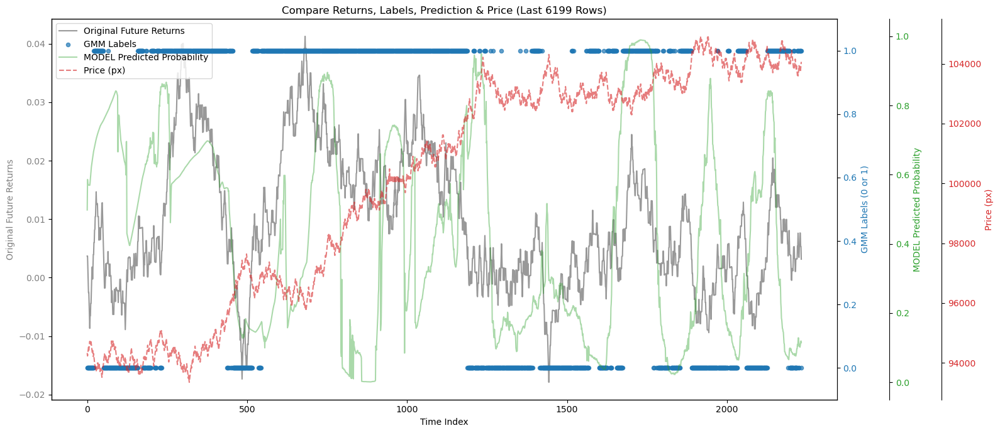


=== tabnet 评估结果 ===
📊 全样本准确率: 0.5000
✅ 自信预测准确率: 0.4430 (阈值 0.15-0.85)
📈 出手率: 60.62%

🧮 自信预测混淆矩阵:
[[266 446]
 [263 298]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.50      0.37      0.43       712
           1       0.40      0.53      0.46       561

    accuracy                           0.44      1273
   macro avg       0.45      0.45      0.44      1273
weighted avg       0.46      0.44      0.44      1273



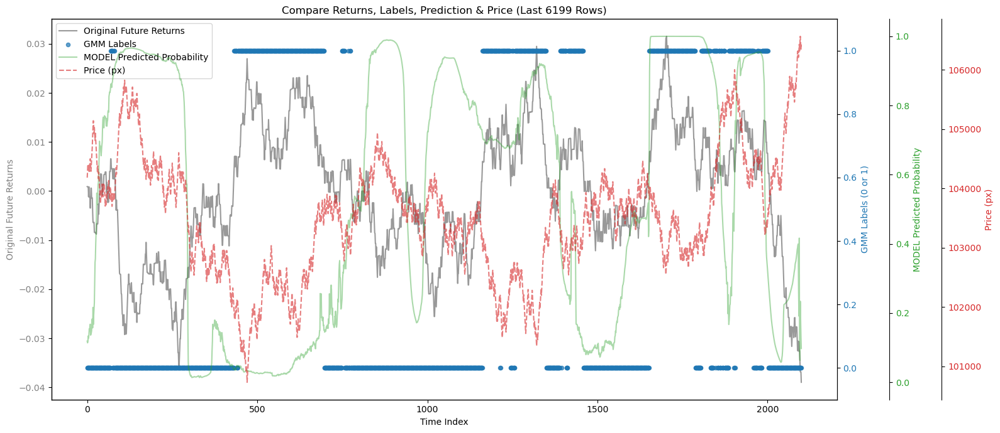

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 0.86762 | val_0_accuracy: 0.47246 |  0:00:01s
epoch 1  | loss: 0.65996 | val_0_accuracy: 0.40484 |  0:00:02s
epoch 2  | loss: 0.64161 | val_0_accuracy: 0.44604 |  0:00:03s
epoch 3  | loss: 0.57919 | val_0_accuracy: 0.41917 |  0:00:05s
epoch 4  | loss: 0.53472 | val_0_accuracy: 0.42633 |  0:00:06s
epoch 5  | loss: 0.5099  | val_0_accuracy: 0.36677 |  0:00:07s
epoch 6  | loss: 0.48864 | val_0_accuracy: 0.36991 |  0:00:08s
epoch 7  | loss: 0.45236 | val_0_accuracy: 0.44066 |  0:00:10s
epoch 8  | loss: 0.40081 | val_0_accuracy: 0.40573 |  0:00:11s
epoch 9  | loss: 0.35913 | val_0_accuracy: 0.40036 |  0:00:12s
epoch 10 | loss: 0.33366 | val_0_accuracy: 0.42678 |  0:00:14s
epoch 11 | loss: 0.31572 | val_0_accuracy: 0.36677 |  0:00:15s
epoch 12 | loss: 0.33715 | val_0_accuracy: 0.36588 |  0:00:16s
epoch 13 | loss: 0.32438 | val_0_accuracy: 0.41424 |  0:00:18s
epoch 14 | loss: 0.31122 | val_0_accuracy: 0.38245 |  0:00:19s
epoch 15 | loss: 0.31208 | val_0_accuracy: 0.4326  |  0

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)



=== tab_inc 评估结果 ===
📊 全样本准确率: 0.5584
✅ 自信预测准确率: 0.5286 (阈值 0.15-0.85)
📈 出手率: 30.50%

🧮 自信预测混淆矩阵:
[[201  39]
 [282 159]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.42      0.84      0.56       240
           1       0.80      0.36      0.50       441

    accuracy                           0.53       681
   macro avg       0.61      0.60      0.53       681
weighted avg       0.67      0.53      0.52       681



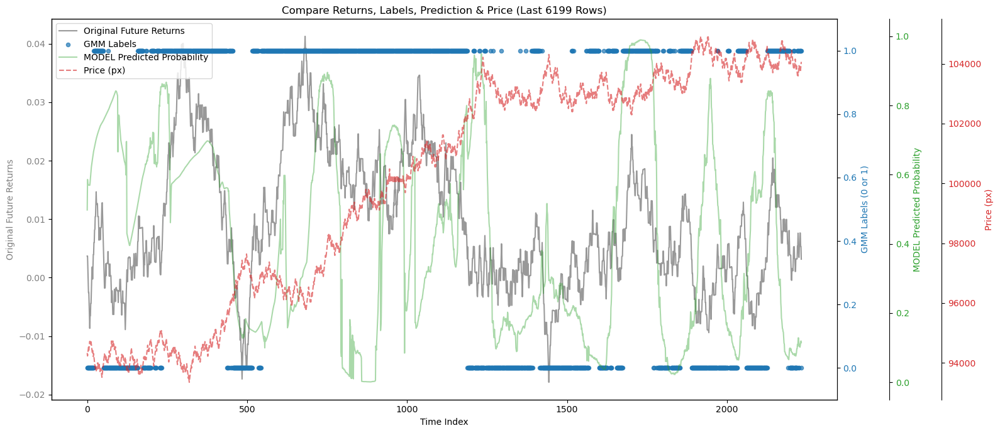


=== tab_inc 评估结果 ===
📊 全样本准确率: 0.5000
✅ 自信预测准确率: 0.4430 (阈值 0.15-0.85)
📈 出手率: 60.62%

🧮 自信预测混淆矩阵:
[[266 446]
 [263 298]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.50      0.37      0.43       712
           1       0.40      0.53      0.46       561

    accuracy                           0.44      1273
   macro avg       0.45      0.45      0.44      1273
weighted avg       0.46      0.44      0.44      1273



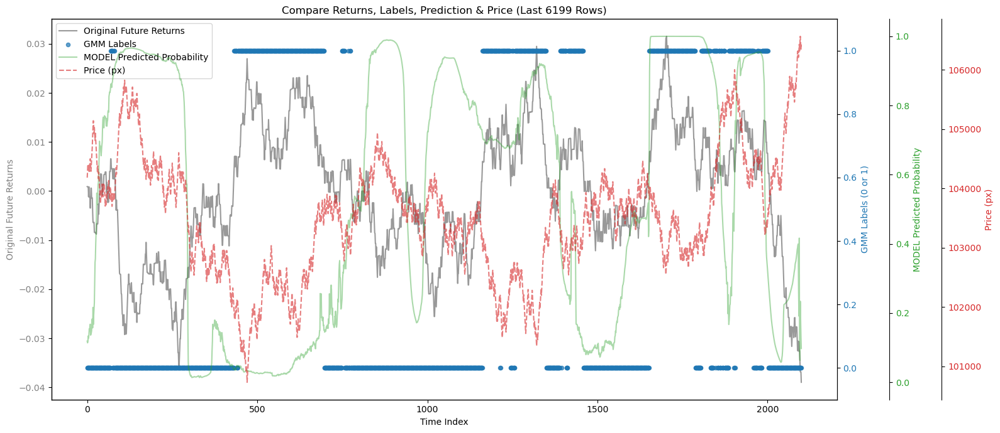

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 1.37651 |  0:00:00s
epoch 1  | loss: 0.65631 |  0:00:00s
epoch 2  | loss: 0.50593 |  0:00:00s
epoch 3  | loss: 0.44309 |  0:00:00s
epoch 4  | loss: 0.41972 |  0:00:00s
epoch 5  | loss: 0.41207 |  0:00:00s
epoch 6  | loss: 0.39311 |  0:00:00s
epoch 7  | loss: 0.36949 |  0:00:00s
epoch 8  | loss: 0.36379 |  0:00:00s
epoch 9  | loss: 0.33868 |  0:00:01s
epoch 10 | loss: 0.32971 |  0:00:01s
epoch 11 | loss: 0.32099 |  0:00:01s
epoch 12 | loss: 0.32185 |  0:00:01s
epoch 13 | loss: 0.32366 |  0:00:01s
epoch 14 | loss: 0.3289  |  0:00:01s
epoch 15 | loss: 0.42639 |  0:00:01s
epoch 16 | loss: 0.4268  |  0:00:01s
epoch 17 | loss: 0.41013 |  0:00:01s
epoch 18 | loss: 0.37897 |  0:00:01s
epoch 19 | loss: 0.37631 |  0:00:02s
epoch 20 | loss: 0.34525 |  0:00:02s
epoch 21 | loss: 0.3547  |  0:00:02s
epoch 22 | loss: 0.37974 |  0:00:02s
epoch 23 | loss: 0.37077 |  0:00:02s
epoch 24 | loss: 0.37721 |  0:00:02s
epoch 25 | loss: 0.36507 |  0:00:02s
epoch 26 | loss: 0.33841 |  0:00:02s
e

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.


=== lgb_model 评估结果 ===
📊 全样本准确率: 0.7405
✅ 自信预测准确率: 0.7684 (阈值 0.15-0.85)
📈 出手率: 67.24%

🧮 自信预测混淆矩阵:
[[1085    0]
 [ 327    0]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.77      1.00      0.87      1085
           1       0.00      0.00      0.00       327

    accuracy                           0.77      1412
   macro avg       0.38      0.50      0.43      1412
weighted avg       0.59      0.77      0.67      1412



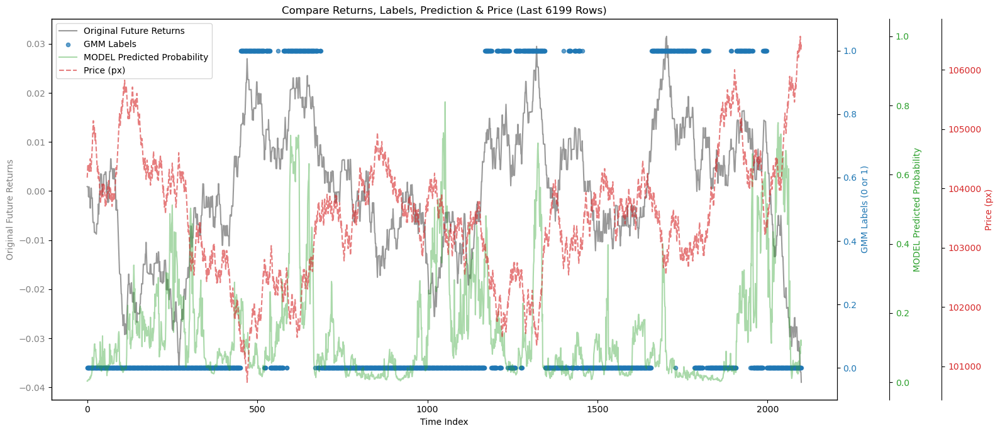


=== lgb_model 评估结果 ===
📊 全样本准确率: 0.6130
✅ 自信预测准确率: 0.6023 (阈值 0.15-0.85)
📈 出手率: 63.29%

🧮 自信预测混淆矩阵:
[[1234   16]
 [ 804    8]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.61      0.99      0.75      1250
           1       0.33      0.01      0.02       812

    accuracy                           0.60      2062
   macro avg       0.47      0.50      0.38      2062
weighted avg       0.50      0.60      0.46      2062



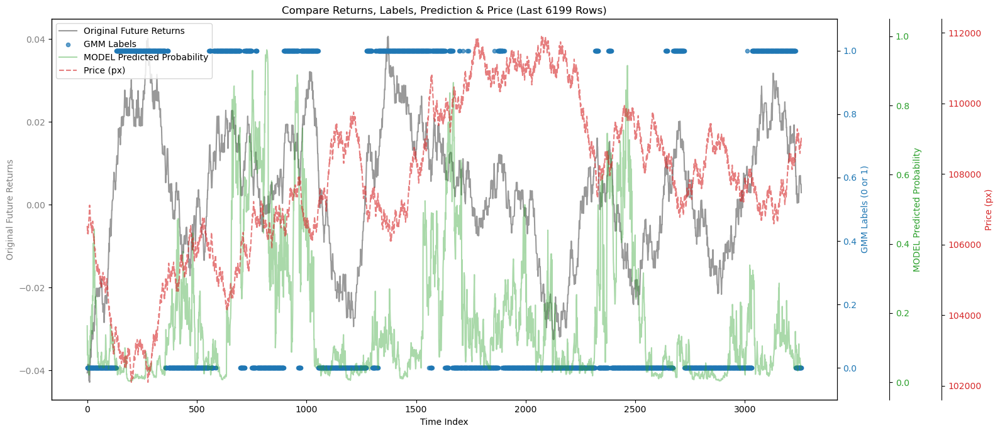


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.6829
✅ 自信预测准确率: 0.6894 (阈值 0.15-0.85)
📈 出手率: 68.52%

🧮 自信预测混淆矩阵:
[[980  27]
 [420  12]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.70      0.97      0.81      1007
           1       0.31      0.03      0.05       432

    accuracy                           0.69      1439
   macro avg       0.50      0.50      0.43      1439
weighted avg       0.58      0.69      0.59      1439



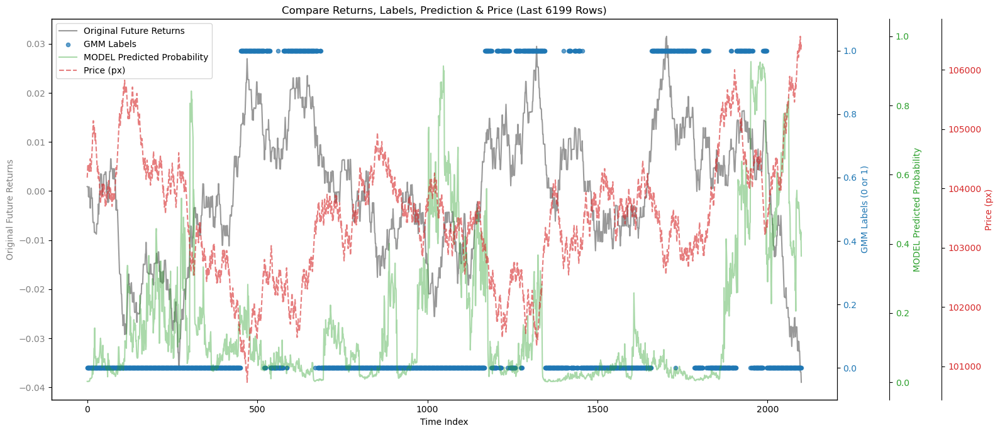


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.6206
✅ 自信预测准确率: 0.6452 (阈值 0.15-0.85)
📈 出手率: 70.07%

🧮 自信预测混淆矩阵:
[[1433   11]
 [ 799   40]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.64      0.99      0.78      1444
           1       0.78      0.05      0.09       839

    accuracy                           0.65      2283
   macro avg       0.71      0.52      0.43      2283
weighted avg       0.69      0.65      0.53      2283



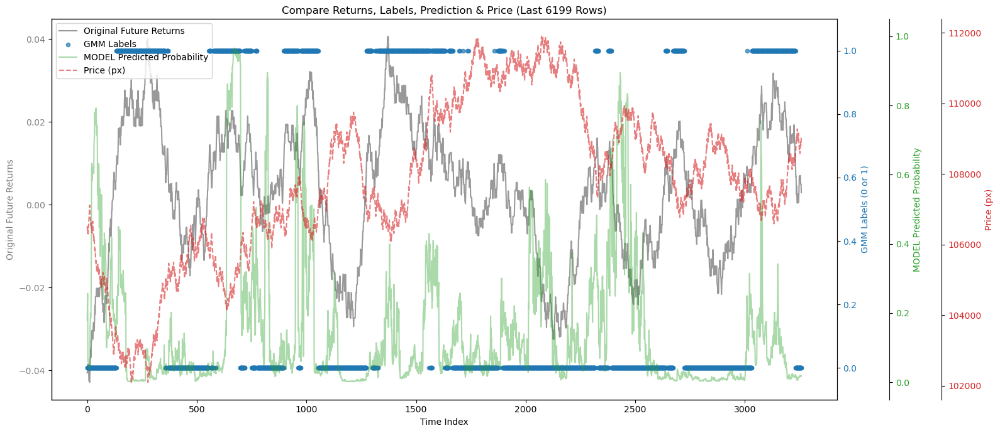

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 0.85272 | val_0_accuracy: 0.51619 |  0:00:00s
epoch 1  | loss: 0.6285  | val_0_accuracy: 0.74381 |  0:00:01s
epoch 2  | loss: 0.56949 | val_0_accuracy: 0.59571 |  0:00:02s
epoch 3  | loss: 0.54141 | val_0_accuracy: 0.71    |  0:00:03s
epoch 4  | loss: 0.51329 | val_0_accuracy: 0.62571 |  0:00:04s
epoch 5  | loss: 0.5047  | val_0_accuracy: 0.64905 |  0:00:04s
epoch 6  | loss: 0.52918 | val_0_accuracy: 0.32667 |  0:00:05s
epoch 7  | loss: 0.52884 | val_0_accuracy: 0.63762 |  0:00:06s
epoch 8  | loss: 0.49305 | val_0_accuracy: 0.44048 |  0:00:07s
epoch 9  | loss: 0.47913 | val_0_accuracy: 0.60571 |  0:00:08s
epoch 10 | loss: 0.45236 | val_0_accuracy: 0.3981  |  0:00:09s
epoch 11 | loss: 0.43542 | val_0_accuracy: 0.56571 |  0:00:09s
epoch 12 | loss: 0.41428 | val_0_accuracy: 0.51952 |  0:00:10s
epoch 13 | loss: 0.44274 | val_0_accuracy: 0.4719  |  0:00:11s
epoch 14 | loss: 0.43049 | val_0_accuracy: 0.57238 |  0:00:12s
epoch 15 | loss: 0.42302 | val_0_accuracy: 0.48714 |  0

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)



=== tabnet 评估结果 ===
📊 全样本准确率: 0.7438
✅ 自信预测准确率: nan (阈值 0.15-0.85)
📈 出手率: 0.00%
⚠️ 无自信预测样本!


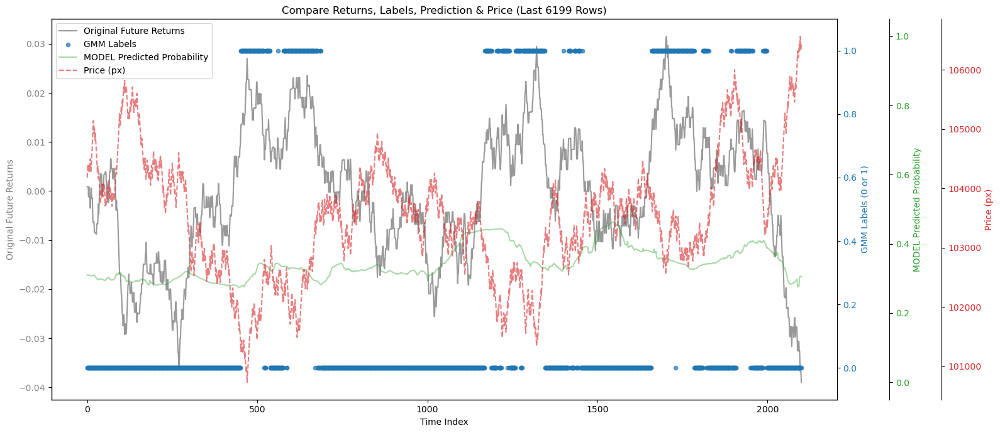


=== tabnet 评估结果 ===
📊 全样本准确率: 0.6280
✅ 自信预测准确率: nan (阈值 0.15-0.85)
📈 出手率: 0.00%
⚠️ 无自信预测样本!


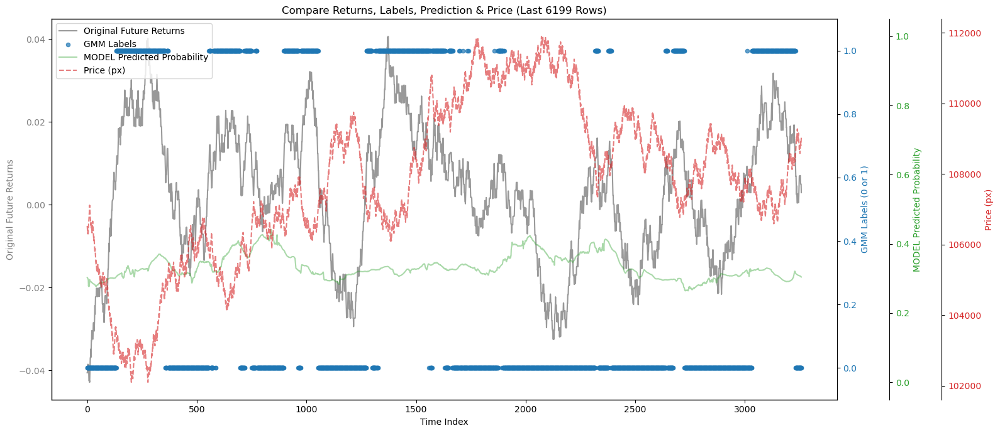

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 2.6501  |  0:00:00s
epoch 1  | loss: 1.12001 |  0:00:00s
epoch 2  | loss: 0.59226 |  0:00:00s
epoch 3  | loss: 0.45292 |  0:00:00s
epoch 4  | loss: 0.42176 |  0:00:00s
epoch 5  | loss: 0.38265 |  0:00:00s
epoch 6  | loss: 0.35029 |  0:00:00s
epoch 7  | loss: 0.33058 |  0:00:00s
epoch 8  | loss: 0.30035 |  0:00:00s
epoch 9  | loss: 0.28513 |  0:00:01s
epoch 10 | loss: 0.27573 |  0:00:01s
epoch 11 | loss: 0.27213 |  0:00:01s
epoch 12 | loss: 0.25843 |  0:00:01s
epoch 13 | loss: 0.25169 |  0:00:01s
epoch 14 | loss: 0.25255 |  0:00:01s
epoch 15 | loss: 0.23962 |  0:00:01s
epoch 16 | loss: 0.24491 |  0:00:01s
epoch 17 | loss: 0.24221 |  0:00:01s
epoch 18 | loss: 0.22795 |  0:00:02s
epoch 19 | loss: 0.24028 |  0:00:02s
epoch 20 | loss: 0.24223 |  0:00:02s
epoch 21 | loss: 0.23265 |  0:00:02s
epoch 22 | loss: 0.21007 |  0:00:02s
epoch 23 | loss: 0.20757 |  0:00:02s
epoch 24 | loss: 0.21899 |  0:00:02s
epoch 25 | loss: 0.21813 |  0:00:02s
epoch 26 | loss: 0.20475 |  0:00:02s
e

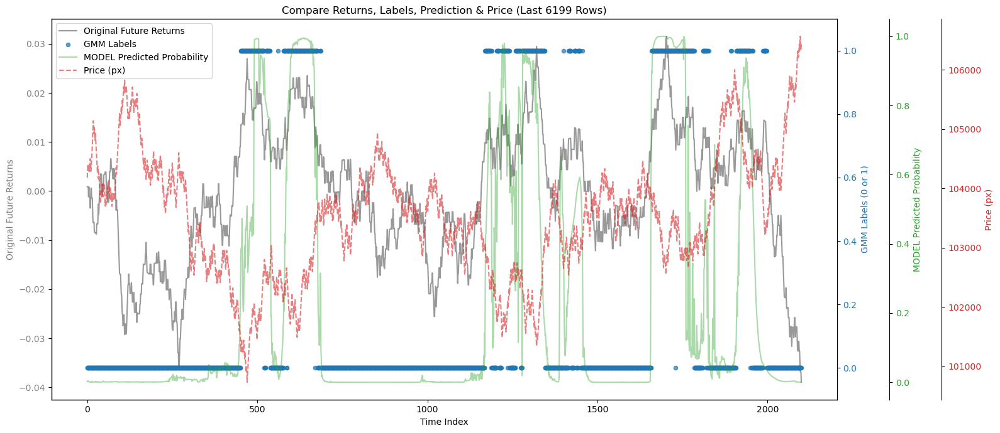


=== tab_inc 评估结果 ===
📊 全样本准确率: 0.5427
✅ 自信预测准确率: 0.5520 (阈值 0.15-0.85)
📈 出手率: 73.24%

🧮 自信预测混淆矩阵:
[[1127  323]
 [ 746  190]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.60      0.78      0.68      1450
           1       0.37      0.20      0.26       936

    accuracy                           0.55      2386
   macro avg       0.49      0.49      0.47      2386
weighted avg       0.51      0.55      0.52      2386



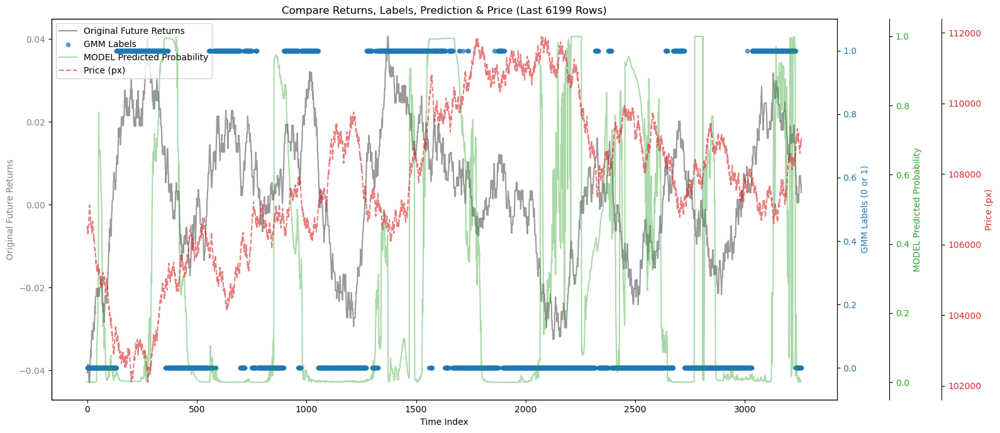

Test Week 5 Evaluation Completed
Fold 2: Train 2~5, Val 6, Test 7
Train: 2025-04-21 00:06:22.525000 to 2025-05-18 23:59:34.191000
Val: 2025-05-19 00:00:37.074000 to 2025-05-25 23:57:24.031000
Test: 2025-05-26 00:01:11.960000 to 2025-06-01 23:52:35.215000
GMM 分量均值: [-0.00284811  0.01350072]
上涨标签: 1, 下跌标签: 0

--- GMM 原始标签 => 最终二元标签映射 ---
GMM 内部标签 0 (均值: -0.002848) => 二元标签: 0
GMM 内部标签 1 (均值: 0.013501) => 二元标签: 1

--- 示例标签 ---
训练集原始收益: [0.02333023 0.02322597 0.02093347 0.01881336 0.01673327 0.01459355
 0.01249175 0.01245281 0.01032588 0.00823417]
训练集GMM标签: [1 1 1 1 1 1 1 1 1 1]
训练集二元标签: [1 1 1 1 1 1 1 1 1 1]

测试集原始收益: [ 0.00356648  0.0035831   0.00354169  0.00354182  0.00359794  0.00356133
  0.00148937 -0.00083526 -0.00084724 -0.00080975]
测试集GMM标签: [0 0 0 0 0 0 0 0 0 0]
测试集二元标签: [0 0 0 0 0 0 0 0 0 0]

=== lgb_model 评估结果 ===
📊 全样本准确率: 0.5580
✅ 自信预测准确率: 0.6104 (阈值 0.15-0.85)
📈 出手率: 33.49%

🧮 自信预测混淆矩阵:
[[480 212]
 [213 186]]

📝 分类报告:
              precision    recall  f1-score   support

    

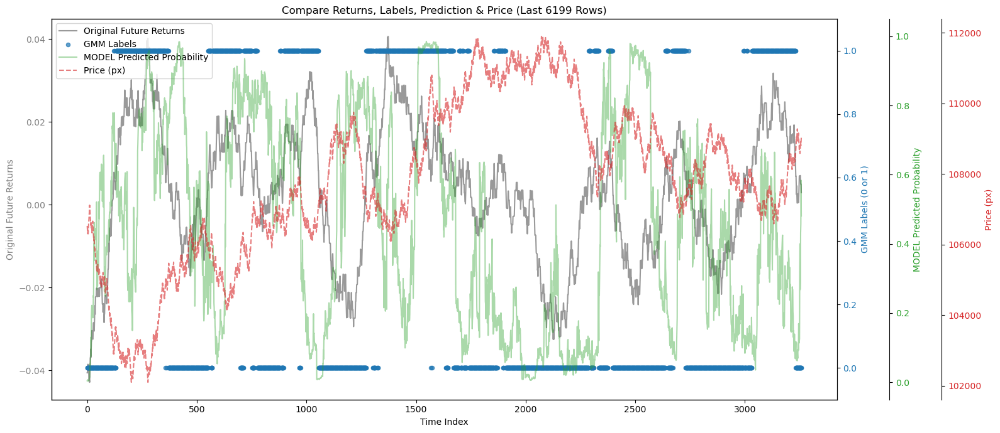


=== lgb_model 评估结果 ===
📊 全样本准确率: 0.4892
✅ 自信预测准确率: 0.6414 (阈值 0.15-0.85)
📈 出手率: 24.02%

🧮 自信预测混淆矩阵:
[[257 171]
 [  4  56]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.98      0.60      0.75       428
           1       0.25      0.93      0.39        60

    accuracy                           0.64       488
   macro avg       0.62      0.77      0.57       488
weighted avg       0.89      0.64      0.70       488



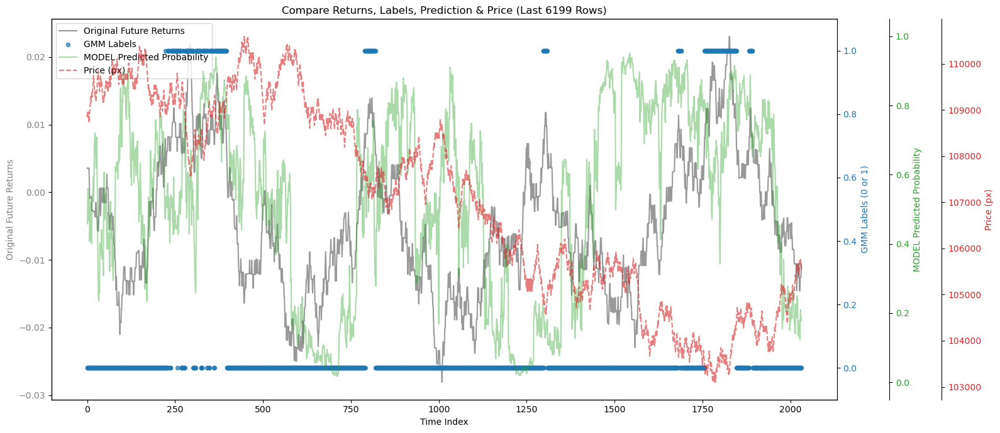


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.5519
✅ 自信预测准确率: 0.5902 (阈值 0.15-0.85)
📈 出手率: 45.09%

🧮 自信预测混淆矩阵:
[[451 373]
 [229 416]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.66      0.55      0.60       824
           1       0.53      0.64      0.58       645

    accuracy                           0.59      1469
   macro avg       0.60      0.60      0.59      1469
weighted avg       0.60      0.59      0.59      1469



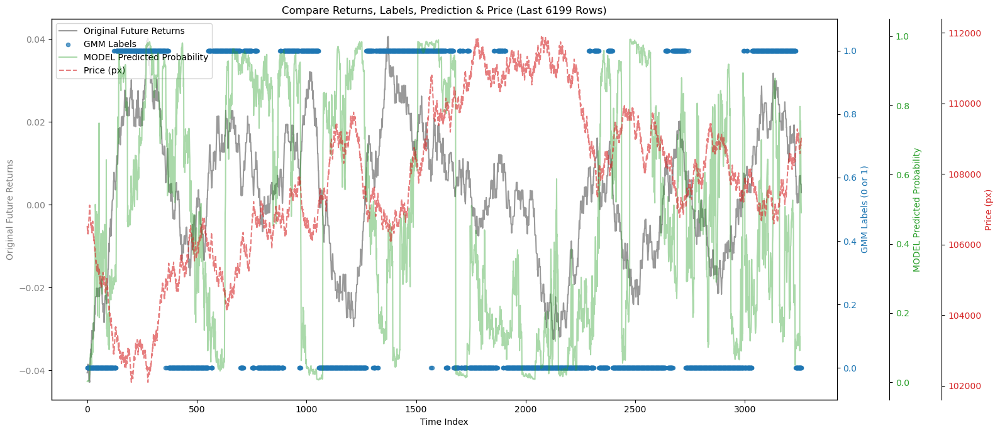


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.4311
✅ 自信预测准确率: 0.4620 (阈值 0.15-0.85)
📈 出手率: 42.08%

🧮 自信预测混淆矩阵:
[[341 441]
 [ 19  54]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.95      0.44      0.60       782
           1       0.11      0.74      0.19        73

    accuracy                           0.46       855
   macro avg       0.53      0.59      0.39       855
weighted avg       0.88      0.46      0.56       855



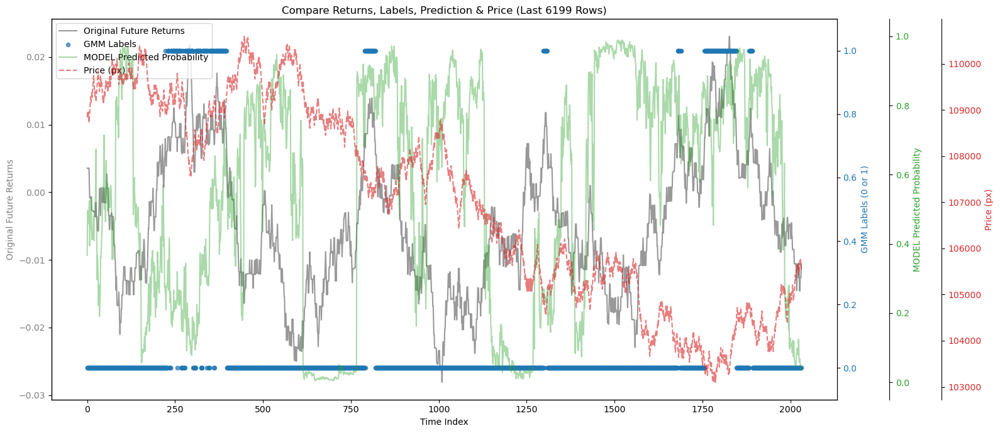

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 0.89157 | val_0_accuracy: 0.57888 |  0:00:00s
epoch 1  | loss: 0.63639 | val_0_accuracy: 0.58226 |  0:00:01s
epoch 2  | loss: 0.60836 | val_0_accuracy: 0.58226 |  0:00:02s
epoch 3  | loss: 0.60803 | val_0_accuracy: 0.57888 |  0:00:03s
epoch 4  | loss: 0.58614 | val_0_accuracy: 0.57858 |  0:00:04s
epoch 5  | loss: 0.59491 | val_0_accuracy: 0.52885 |  0:00:05s
epoch 6  | loss: 0.56572 | val_0_accuracy: 0.56354 |  0:00:06s
epoch 7  | loss: 0.53151 | val_0_accuracy: 0.53468 |  0:00:07s
epoch 8  | loss: 0.55217 | val_0_accuracy: 0.50737 |  0:00:08s
epoch 9  | loss: 0.53333 | val_0_accuracy: 0.50552 |  0:00:09s
epoch 10 | loss: 0.48269 | val_0_accuracy: 0.58226 |  0:00:10s
epoch 11 | loss: 0.45857 | val_0_accuracy: 0.55648 |  0:00:11s
epoch 12 | loss: 0.40778 | val_0_accuracy: 0.56384 |  0:00:11s
epoch 13 | loss: 0.38228 | val_0_accuracy: 0.47238 |  0:00:12s
epoch 14 | loss: 0.37386 | val_0_accuracy: 0.48465 |  0:00:13s
epoch 15 | loss: 0.37984 | val_0_accuracy: 0.47729 |  0

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)



=== tabnet 评估结果 ===
📊 全样本准确率: 0.5823
✅ 自信预测准确率: nan (阈值 0.15-0.85)
📈 出手率: 0.00%
⚠️ 无自信预测样本!


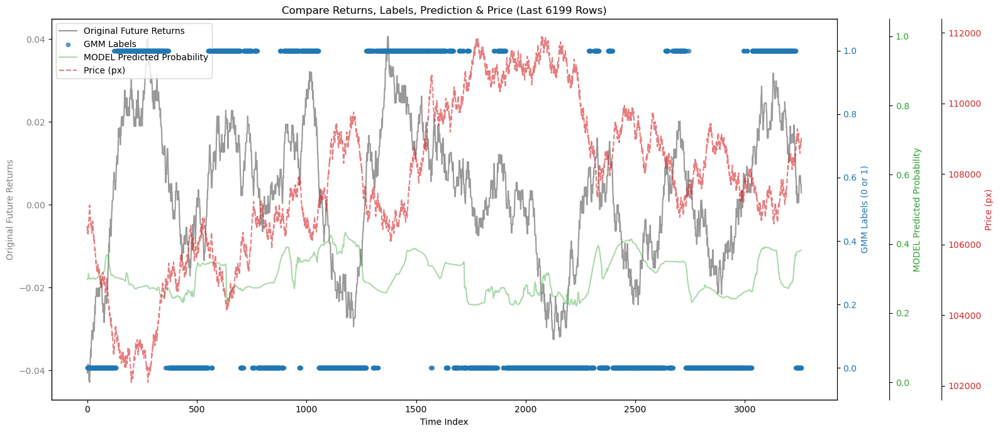


=== tabnet 评估结果 ===
📊 全样本准确率: 0.8578
✅ 自信预测准确率: nan (阈值 0.15-0.85)
📈 出手率: 0.00%
⚠️ 无自信预测样本!


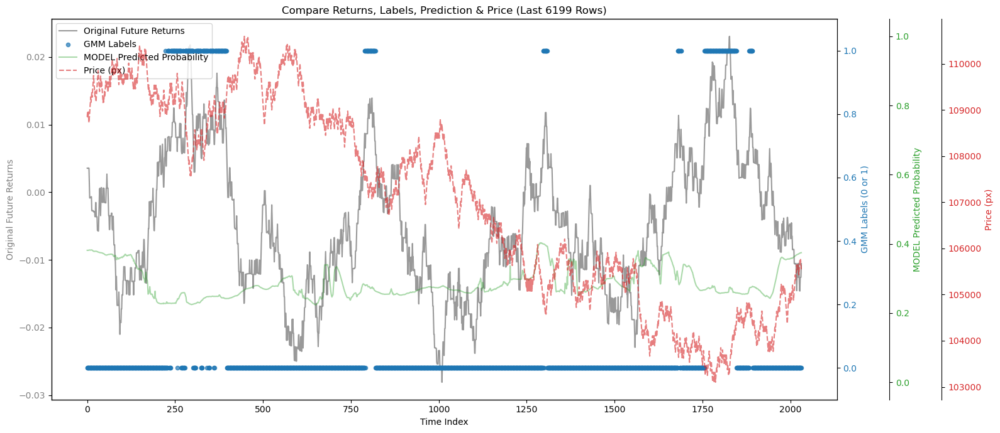

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 1.85574 |  0:00:00s
epoch 1  | loss: 0.97564 |  0:00:00s
epoch 2  | loss: 0.59828 |  0:00:00s
epoch 3  | loss: 0.48909 |  0:00:00s
epoch 4  | loss: 0.4313  |  0:00:00s
epoch 5  | loss: 0.4039  |  0:00:00s
epoch 6  | loss: 0.35489 |  0:00:01s
epoch 7  | loss: 0.31821 |  0:00:01s
epoch 8  | loss: 0.28074 |  0:00:01s
epoch 9  | loss: 0.26685 |  0:00:01s
epoch 10 | loss: 0.25939 |  0:00:01s
epoch 11 | loss: 0.23919 |  0:00:01s
epoch 12 | loss: 0.24249 |  0:00:01s
epoch 13 | loss: 0.23932 |  0:00:02s
epoch 14 | loss: 0.22948 |  0:00:02s
epoch 15 | loss: 0.23113 |  0:00:02s
epoch 16 | loss: 0.20893 |  0:00:02s
epoch 17 | loss: 0.20659 |  0:00:02s
epoch 18 | loss: 0.20899 |  0:00:02s
epoch 19 | loss: 0.19679 |  0:00:02s
epoch 20 | loss: 0.1906  |  0:00:03s
epoch 21 | loss: 0.1849  |  0:00:03s
epoch 22 | loss: 0.179   |  0:00:03s
epoch 23 | loss: 0.1809  |  0:00:03s
epoch 24 | loss: 0.17872 |  0:00:03s
epoch 25 | loss: 0.18764 |  0:00:03s
epoch 26 | loss: 0.18992 |  0:00:03s
e

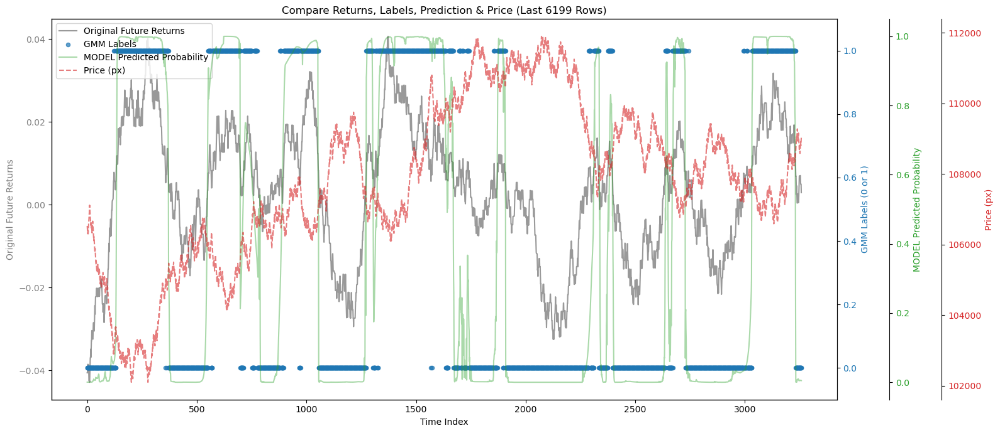


=== tab_inc 评估结果 ===
📊 全样本准确率: 0.7003
✅ 自信预测准确率: 0.7559 (阈值 0.15-0.85)
📈 出手率: 77.21%

🧮 自信预测混淆矩阵:
[[1090  338]
 [  45   96]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.96      0.76      0.85      1428
           1       0.22      0.68      0.33       141

    accuracy                           0.76      1569
   macro avg       0.59      0.72      0.59      1569
weighted avg       0.89      0.76      0.80      1569



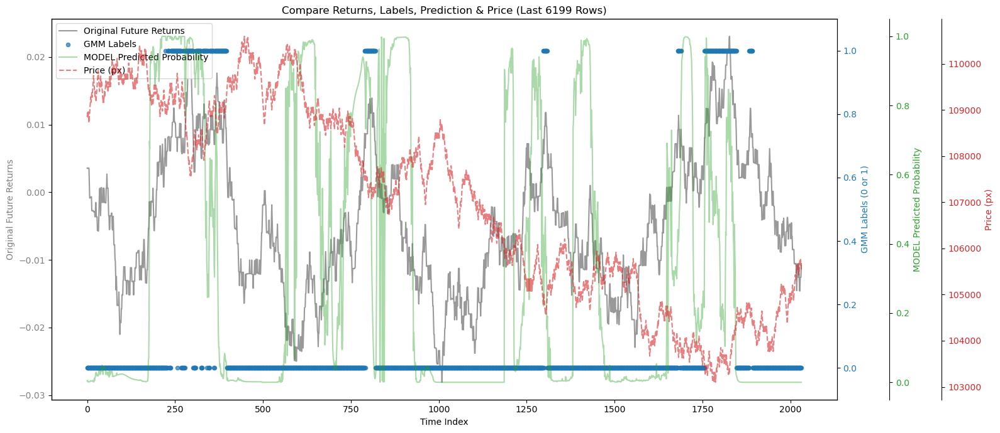

Test Week 6 Evaluation Completed
Fold 3: Train 3~6, Val 7, Test 8
Train: 2025-04-28 00:06:59.957000 to 2025-05-25 23:57:24.031000
Val: 2025-05-26 00:01:11.960000 to 2025-06-01 23:52:35.215000
Test: 2025-06-02 00:06:44.065000 to 2025-06-08 23:58:17.188000
GMM 分量均值: [ 0.01237537 -0.00535031]
上涨标签: 0, 下跌标签: 1

--- GMM 原始标签 => 最终二元标签映射 ---
GMM 内部标签 0 (均值: 0.012375) => 二元标签: 1
GMM 内部标签 1 (均值: -0.005350) => 二元标签: 0

--- 示例标签 ---
训练集原始收益: [0.00323932 0.00326096 0.00553419 0.0076164  0.00771151 0.0076466
 0.01014335 0.008064   0.01017145 0.01224453]
训练集GMM标签: [1 1 0 0 0 0 0 0 0 0]
训练集二元标签: [0 0 1 1 1 1 1 1 1 1]

测试集原始收益: [-0.00880809 -0.00879709 -0.01095481 -0.01114951 -0.01117422 -0.01317441
 -0.01115228 -0.00916311 -0.01117488 -0.01112979]
测试集GMM标签: [1 1 1 1 1 1 1 1 1 1]
测试集二元标签: [0 0 0 0 0 0 0 0 0 0]

=== lgb_model 评估结果 ===
📊 全样本准确率: 0.5394
✅ 自信预测准确率: 0.5534 (阈值 0.15-0.85)
📈 出手率: 29.97%

🧮 自信预测混淆矩阵:
[[326  37]
 [235  11]]

📝 分类报告:
              precision    recall  f1-score   support

     

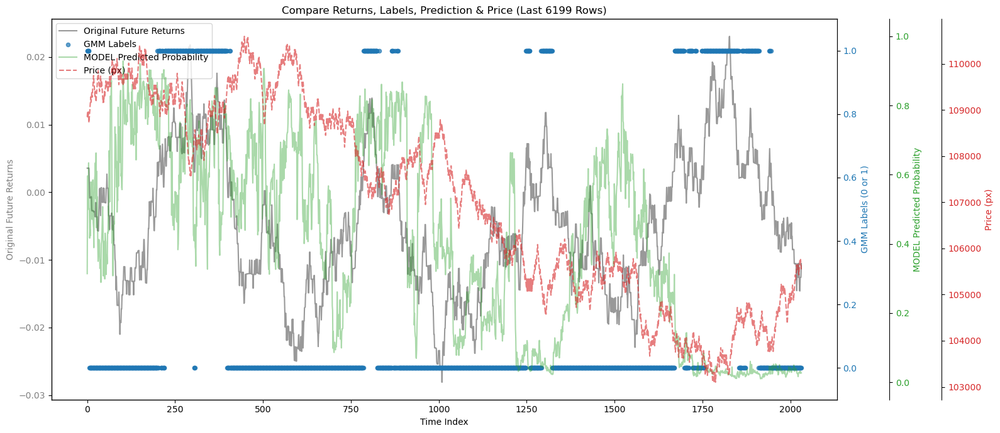


=== lgb_model 评估结果 ===
📊 全样本准确率: 0.4922
✅ 自信预测准确率: 0.4851 (阈值 0.15-0.85)
📈 出手率: 31.54%

🧮 自信预测混淆矩阵:
[[226  23]
 [236  18]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.49      0.91      0.64       249
           1       0.44      0.07      0.12       254

    accuracy                           0.49       503
   macro avg       0.46      0.49      0.38       503
weighted avg       0.46      0.49      0.38       503



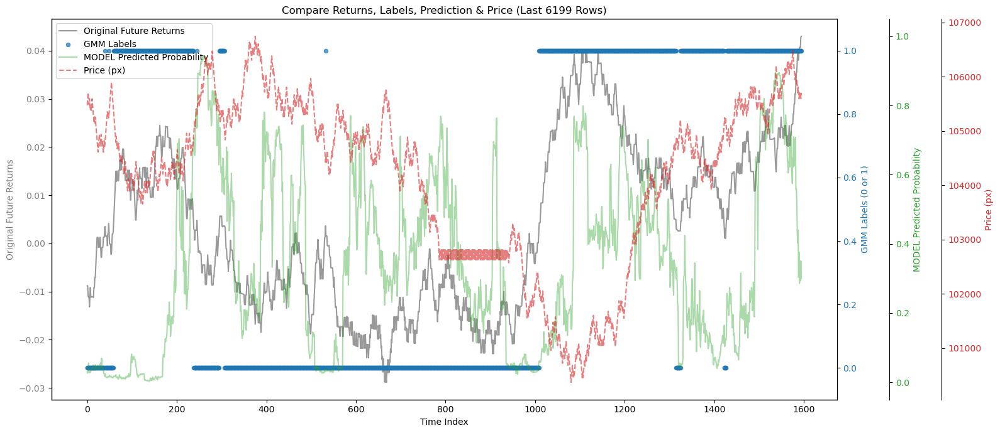


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.5472
✅ 自信预测准确率: 0.6530 (阈值 0.15-0.85)
📈 出手率: 38.44%

🧮 自信预测混淆矩阵:
[[410  74]
 [197 100]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.68      0.85      0.75       484
           1       0.57      0.34      0.42       297

    accuracy                           0.65       781
   macro avg       0.63      0.59      0.59       781
weighted avg       0.64      0.65      0.63       781



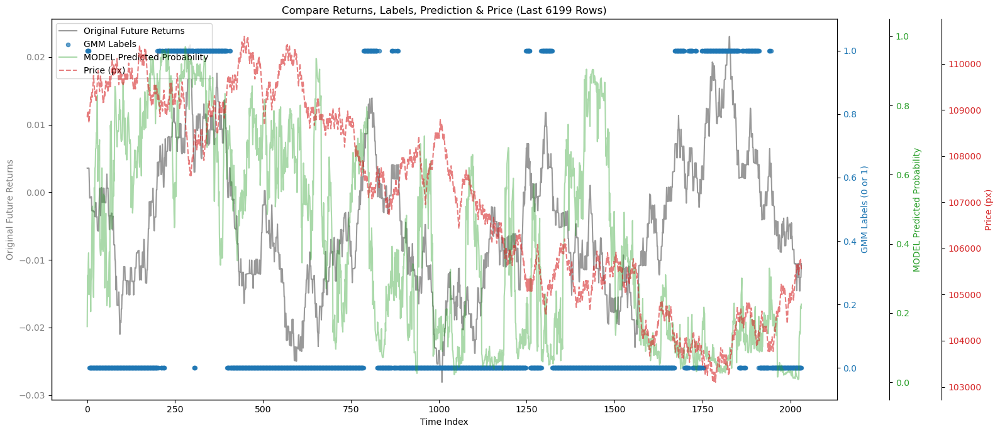


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.4734
✅ 自信预测准确率: 0.5363 (阈值 0.15-0.85)
📈 出手率: 37.99%

🧮 自信预测混淆矩阵:
[[244  61]
 [220  81]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.53      0.80      0.63       305
           1       0.57      0.27      0.37       301

    accuracy                           0.54       606
   macro avg       0.55      0.53      0.50       606
weighted avg       0.55      0.54      0.50       606



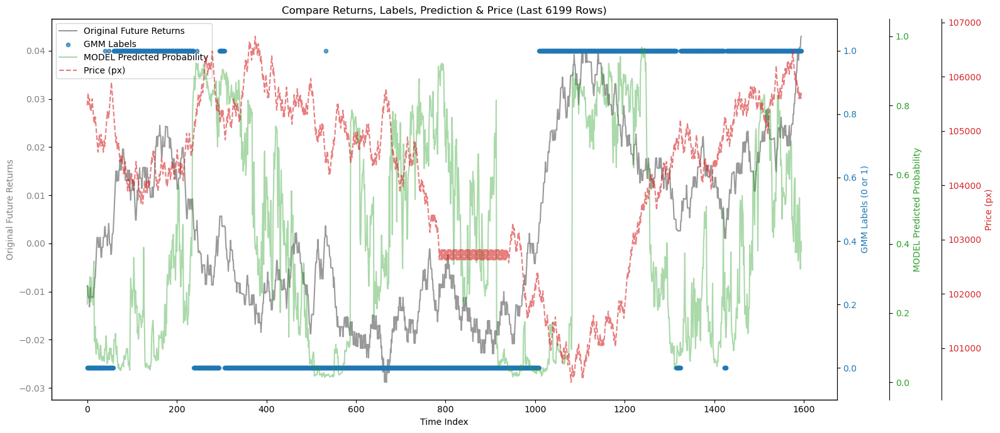

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 1.0031  | val_0_accuracy: 0.55069 |  0:00:00s
epoch 1  | loss: 0.71093 | val_0_accuracy: 0.61614 |  0:00:01s
epoch 2  | loss: 0.63026 | val_0_accuracy: 0.71555 |  0:00:02s
epoch 3  | loss: 0.54896 | val_0_accuracy: 0.28396 |  0:00:03s
epoch 4  | loss: 0.58747 | val_0_accuracy: 0.56004 |  0:00:04s
epoch 5  | loss: 0.55777 | val_0_accuracy: 0.49902 |  0:00:04s
epoch 6  | loss: 0.58129 | val_0_accuracy: 0.59449 |  0:00:05s
epoch 7  | loss: 0.53713 | val_0_accuracy: 0.40404 |  0:00:06s
epoch 8  | loss: 0.49996 | val_0_accuracy: 0.63386 |  0:00:07s
epoch 9  | loss: 0.46015 | val_0_accuracy: 0.47146 |  0:00:08s
epoch 10 | loss: 0.42716 | val_0_accuracy: 0.42028 |  0:00:08s
epoch 11 | loss: 0.43955 | val_0_accuracy: 0.43258 |  0:00:09s
epoch 12 | loss: 0.44335 | val_0_accuracy: 0.68701 |  0:00:10s
epoch 13 | loss: 0.48298 | val_0_accuracy: 0.62106 |  0:00:11s
epoch 14 | loss: 0.45045 | val_0_accuracy: 0.44291 |  0:00:12s
epoch 15 | loss: 0.42641 | val_0_accuracy: 0.31398 |  0

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)



=== tabnet 评估结果 ===
📊 全样本准确率: 0.7776
✅ 自信预测准确率: 0.8506 (阈值 0.15-0.85)
📈 出手率: 56.64%

🧮 自信预测混淆矩阵:
[[927   0]
 [172  52]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.84      1.00      0.92       927
           1       1.00      0.23      0.38       224

    accuracy                           0.85      1151
   macro avg       0.92      0.62      0.65      1151
weighted avg       0.87      0.85      0.81      1151



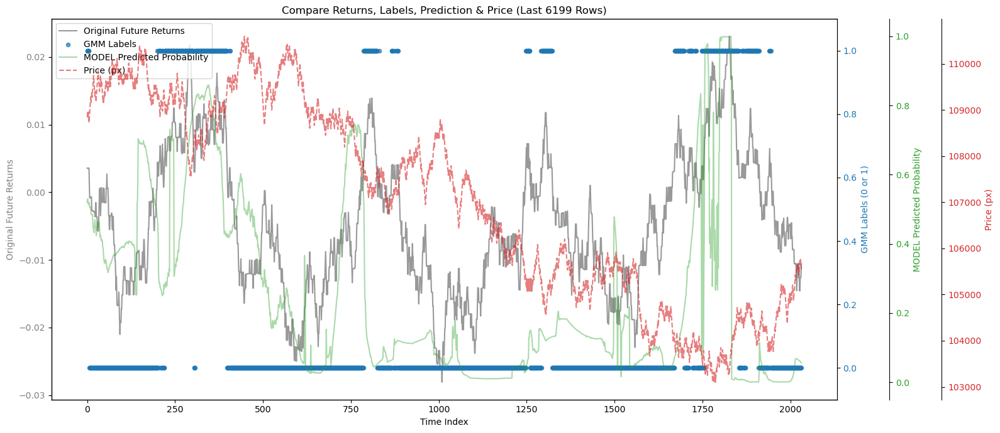


=== tabnet 评估结果 ===
📊 全样本准确率: 0.5329
✅ 自信预测准确率: 0.6697 (阈值 0.15-0.85)
📈 出手率: 47.65%

🧮 自信预测混淆矩阵:
[[454   4]
 [247  55]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.65      0.99      0.78       458
           1       0.93      0.18      0.30       302

    accuracy                           0.67       760
   macro avg       0.79      0.59      0.54       760
weighted avg       0.76      0.67      0.59       760



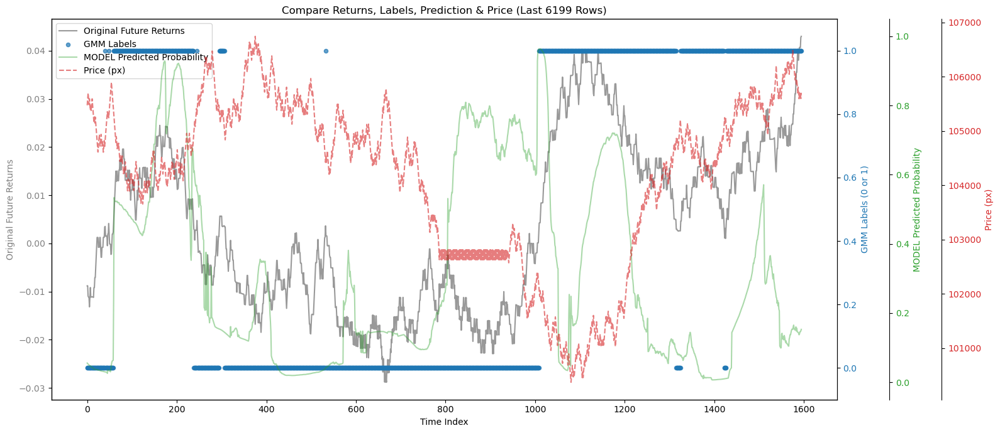

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 1.4514  |  0:00:00s
epoch 1  | loss: 0.9524  |  0:00:00s
epoch 2  | loss: 0.67194 |  0:00:00s
epoch 3  | loss: 0.74739 |  0:00:00s
epoch 4  | loss: 0.52742 |  0:00:00s
epoch 5  | loss: 0.39369 |  0:00:00s
epoch 6  | loss: 0.30404 |  0:00:00s
epoch 7  | loss: 0.25784 |  0:00:00s
epoch 8  | loss: 0.27124 |  0:00:00s
epoch 9  | loss: 0.27153 |  0:00:00s
epoch 10 | loss: 0.24217 |  0:00:00s
epoch 11 | loss: 0.23302 |  0:00:00s
epoch 12 | loss: 0.23549 |  0:00:00s
epoch 13 | loss: 0.23528 |  0:00:00s
epoch 14 | loss: 0.20691 |  0:00:00s
epoch 15 | loss: 0.2189  |  0:00:00s
epoch 16 | loss: 0.23531 |  0:00:00s
epoch 17 | loss: 0.20466 |  0:00:00s
epoch 18 | loss: 0.25187 |  0:00:00s
epoch 19 | loss: 0.20774 |  0:00:01s
epoch 20 | loss: 0.22002 |  0:00:01s
epoch 21 | loss: 0.20496 |  0:00:01s
epoch 22 | loss: 0.21001 |  0:00:01s
epoch 23 | loss: 0.21828 |  0:00:01s
epoch 24 | loss: 0.19384 |  0:00:01s
epoch 25 | loss: 0.21983 |  0:00:01s
epoch 26 | loss: 0.22966 |  0:00:01s
e

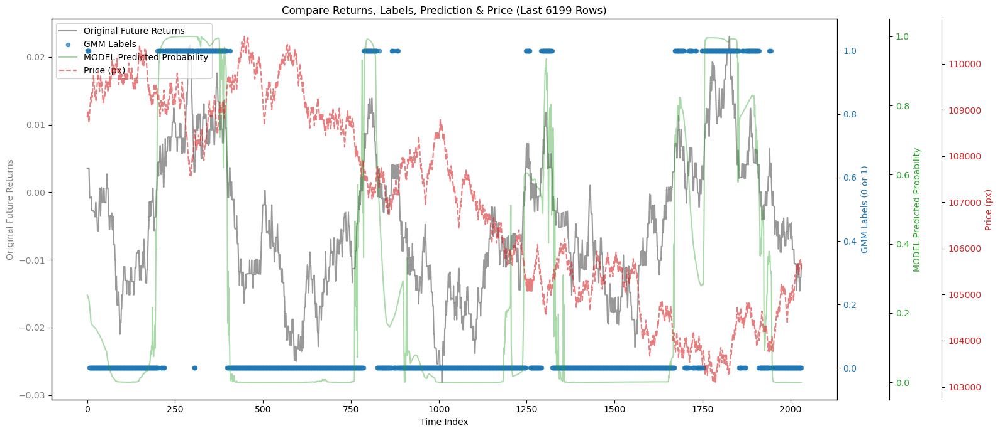


=== tab_inc 评估结果 ===
📊 全样本准确率: 0.5680
✅ 自信预测准确率: 0.5154 (阈值 0.15-0.85)
📈 出手率: 79.56%

🧮 自信预测混淆矩阵:
[[576   0]
 [615  78]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.48      1.00      0.65       576
           1       1.00      0.11      0.20       693

    accuracy                           0.52      1269
   macro avg       0.74      0.56      0.43      1269
weighted avg       0.77      0.52      0.41      1269



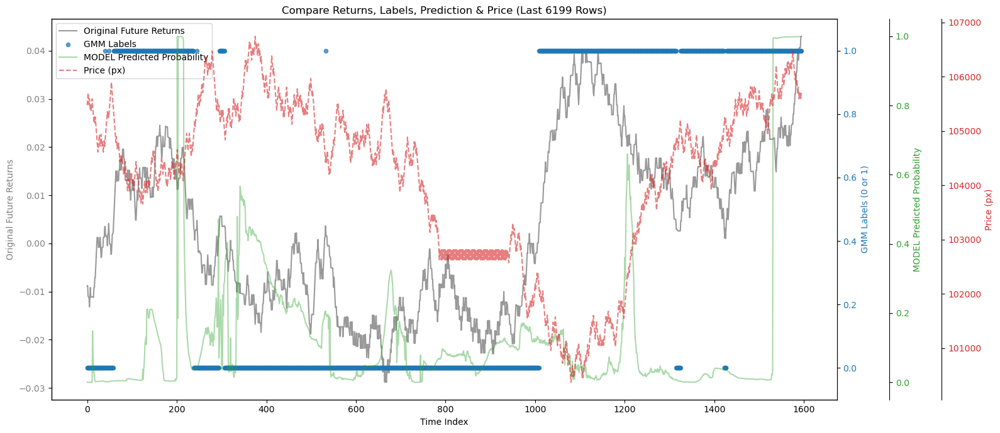

Test Week 7 Evaluation Completed
Fold 4: Train 4~7, Val 8, Test 9
Train: 2025-05-05 00:01:39.539000 to 2025-06-01 23:52:35.215000
Val: 2025-06-02 00:06:44.065000 to 2025-06-08 23:58:17.188000
Test: 2025-06-09 00:07:03.215000 to 2025-06-09 14:01:01.788000
GMM 分量均值: [-0.00629565  0.01162737]
上涨标签: 1, 下跌标签: 0

--- GMM 原始标签 => 最终二元标签映射 ---
GMM 内部标签 0 (均值: -0.006296) => 二元标签: 0
GMM 内部标签 1 (均值: 0.011627) => 二元标签: 1

--- 示例标签 ---
训练集原始收益: [ 0.00368397  0.00369302  0.00160607 -0.0004681  -0.00256658 -0.00250895
 -0.00455572 -0.00659495 -0.00867212 -0.00654371]
训练集GMM标签: [1 1 0 0 0 0 0 0 0 0]
训练集二元标签: [1 1 0 0 0 0 0 0 0 0]

测试集原始收益: [0.04554953 0.04553511 0.04559621 0.04572619 0.04564277 0.04577073
 0.04343226 0.0436382  0.04575502 0.04567122]
测试集GMM标签: [1 1 1 1 1 1 1 1 1 1]
测试集二元标签: [1 1 1 1 1 1 1 1 1 1]

=== lgb_model 评估结果 ===
📊 全样本准确率: 0.4897
✅ 自信预测准确率: 0.4705 (阈值 0.15-0.85)
📈 出手率: 30.78%

🧮 自信预测混淆矩阵:
[[191   1]
 [259  40]]

📝 分类报告:
              precision    recall  f1-score   support

    

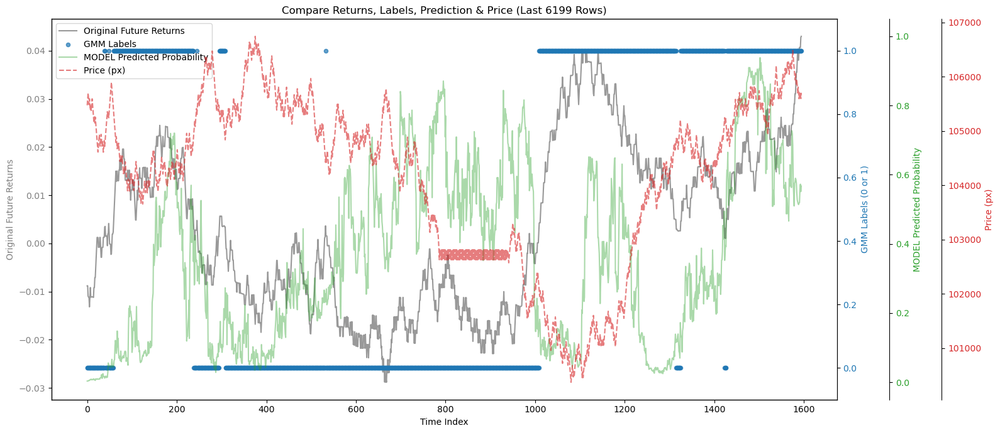

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitali


=== lgb_model 评估结果 ===
📊 全样本准确率: 0.3434
✅ 自信预测准确率: 0.0000 (阈值 0.15-0.85)
📈 出手率: 40.40%

🧮 自信预测混淆矩阵:
[[ 0  0]
 [40  0]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       0.0
           1       0.00      0.00      0.00      40.0

    accuracy                           0.00      40.0
   macro avg       0.00      0.00      0.00      40.0
weighted avg       0.00      0.00      0.00      40.0



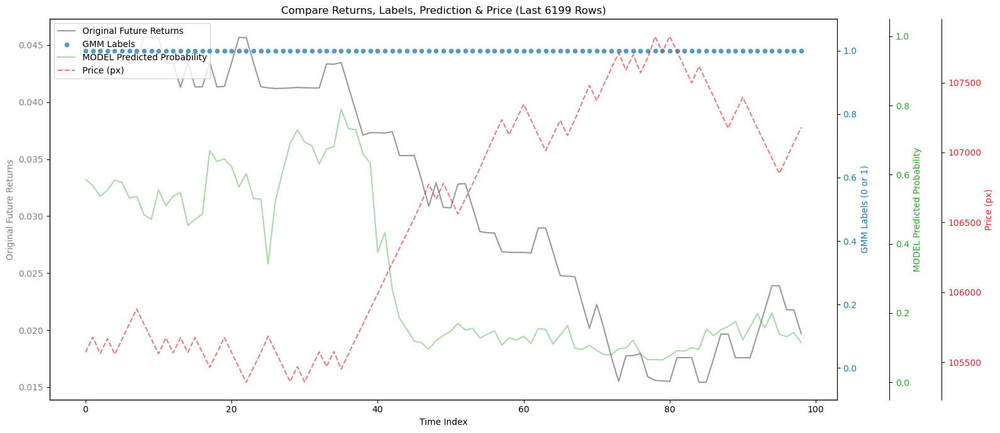


=== xgb_model 评估结果 ===
📊 全样本准确率: 0.4746
✅ 自信预测准确率: 0.4302 (阈值 0.15-0.85)
📈 出手率: 48.97%

🧮 自信预测混淆矩阵:
[[180 112]
 [333 156]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.35      0.62      0.45       292
           1       0.58      0.32      0.41       489

    accuracy                           0.43       781
   macro avg       0.47      0.47      0.43       781
weighted avg       0.50      0.43      0.43       781



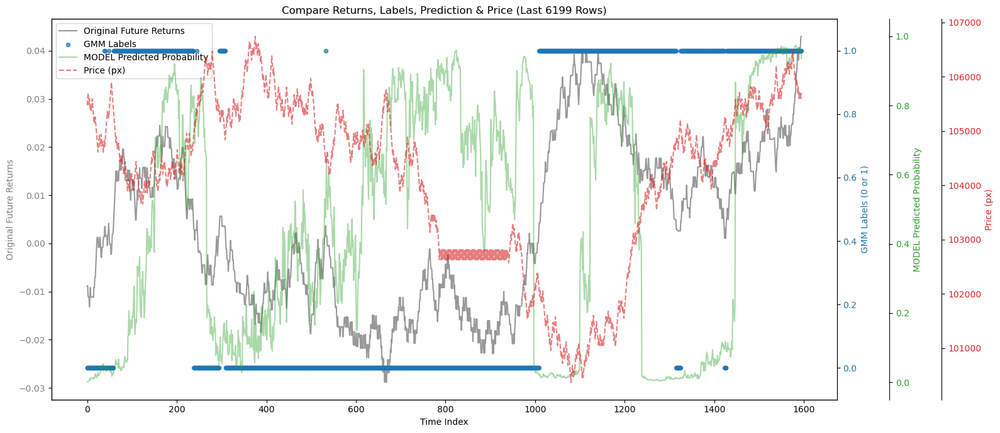

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(



=== xgb_model 评估结果 ===
📊 全样本准确率: 0.9091
✅ 自信预测准确率: 1.0000 (阈值 0.15-0.85)
📈 出手率: 34.34%

🧮 自信预测混淆矩阵:
[[34]]

📝 分类报告:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        34

    accuracy                           1.00        34
   macro avg       1.00      1.00      1.00        34
weighted avg       1.00      1.00      1.00        34



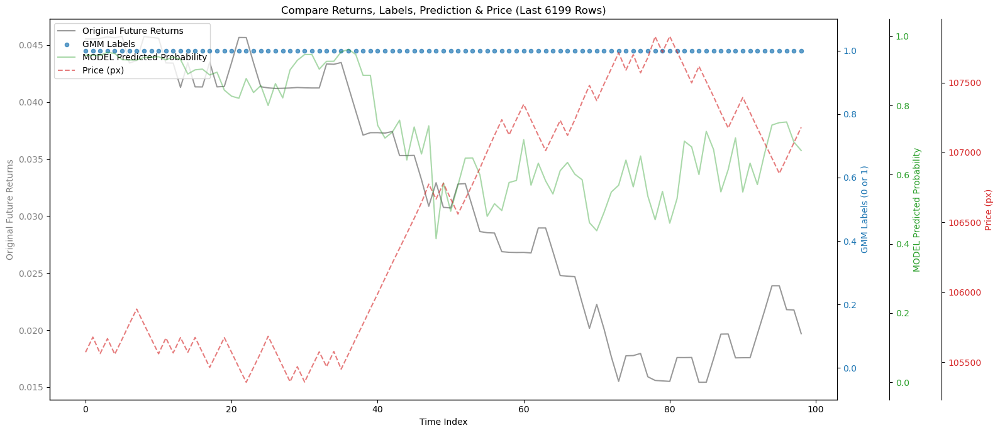

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:82: UserWarning: Device used : cuda
  warnings.warn(f"Device used : {self.device}")


epoch 0  | loss: 0.94541 | val_0_accuracy: 0.41755 |  0:00:00s
epoch 1  | loss: 0.69815 | val_0_accuracy: 0.47586 |  0:00:01s
epoch 2  | loss: 0.65876 | val_0_accuracy: 0.39436 |  0:00:02s
epoch 3  | loss: 0.61587 | val_0_accuracy: 0.52915 |  0:00:03s
epoch 4  | loss: 0.58755 | val_0_accuracy: 0.32978 |  0:00:04s
epoch 5  | loss: 0.56156 | val_0_accuracy: 0.34671 |  0:00:05s
epoch 6  | loss: 0.50107 | val_0_accuracy: 0.47774 |  0:00:06s
epoch 7  | loss: 0.47996 | val_0_accuracy: 0.40376 |  0:00:06s
epoch 8  | loss: 0.4408  | val_0_accuracy: 0.48715 |  0:00:07s
epoch 9  | loss: 0.45287 | val_0_accuracy: 0.55361 |  0:00:08s
epoch 10 | loss: 0.42682 | val_0_accuracy: 0.46771 |  0:00:09s
epoch 11 | loss: 0.4209  | val_0_accuracy: 0.44263 |  0:00:10s
epoch 12 | loss: 0.42501 | val_0_accuracy: 0.5511  |  0:00:11s
epoch 13 | loss: 0.42377 | val_0_accuracy: 0.321   |  0:00:12s
epoch 14 | loss: 0.34466 | val_0_accuracy: 0.26082 |  0:00:12s
epoch 15 | loss: 0.32189 | val_0_accuracy: 0.32665 |  0

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\callbacks.py:172: UserWarning: Best weights from best epoch are automatically used!
  warnings.warn(wrn_msg)



=== tabnet 评估结果 ===
📊 全样本准确率: 0.5536
✅ 自信预测准确率: 0.1695 (阈值 0.15-0.85)
📈 出手率: 3.70%

🧮 自信预测混淆矩阵:
[[ 9 33]
 [16  1]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.36      0.21      0.27        42
           1       0.03      0.06      0.04        17

    accuracy                           0.17        59
   macro avg       0.19      0.14      0.15        59
weighted avg       0.26      0.17      0.20        59



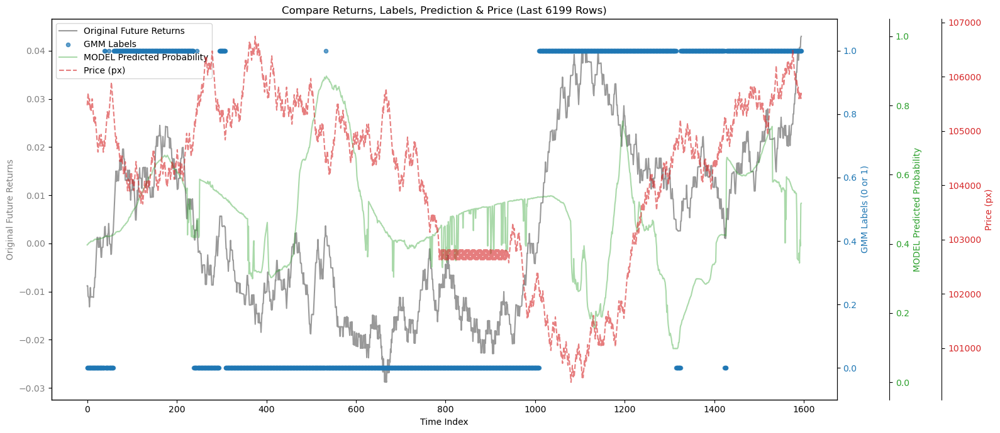


=== tabnet 评估结果 ===
📊 全样本准确率: 0.9394
✅ 自信预测准确率: nan (阈值 0.15-0.85)
📈 出手率: 0.00%
⚠️ 无自信预测样本!


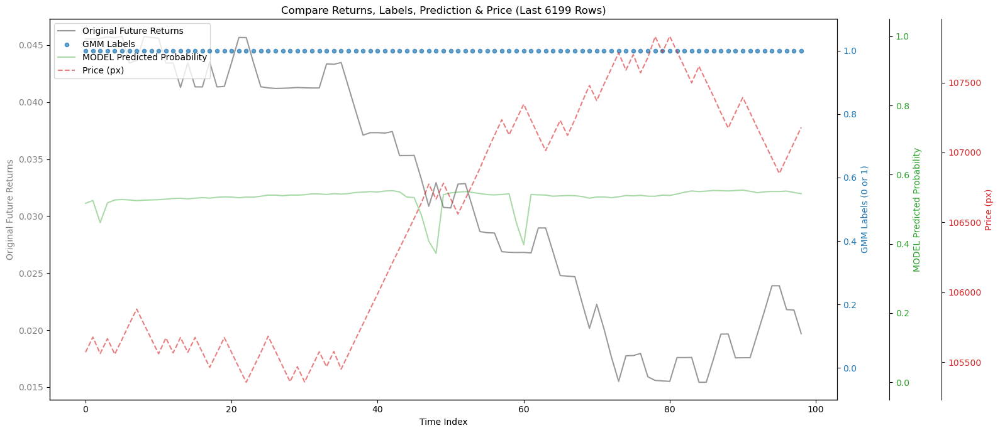

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\pytorch_tabnet\abstract_model.py:687: UserWarning: No early stopping will be performed, last training weights will be used.
  warnings.warn(wrn_msg)


epoch 0  | loss: 3.29175 |  0:00:00s
epoch 1  | loss: 2.22039 |  0:00:00s
epoch 2  | loss: 1.39819 |  0:00:00s
epoch 3  | loss: 0.87961 |  0:00:00s
epoch 4  | loss: 0.70786 |  0:00:00s
epoch 5  | loss: 0.56751 |  0:00:00s
epoch 6  | loss: 0.47906 |  0:00:00s
epoch 7  | loss: 0.39915 |  0:00:00s
epoch 8  | loss: 0.30892 |  0:00:00s
epoch 9  | loss: 0.29032 |  0:00:00s
epoch 10 | loss: 0.24562 |  0:00:00s
epoch 11 | loss: 0.23559 |  0:00:00s
epoch 12 | loss: 0.20204 |  0:00:00s
epoch 13 | loss: 0.20178 |  0:00:00s
epoch 14 | loss: 0.15067 |  0:00:00s
epoch 15 | loss: 0.14844 |  0:00:00s
epoch 16 | loss: 0.13973 |  0:00:00s
epoch 17 | loss: 0.1303  |  0:00:00s
epoch 18 | loss: 0.13903 |  0:00:01s
epoch 19 | loss: 0.15472 |  0:00:01s
epoch 20 | loss: 0.13836 |  0:00:01s
epoch 21 | loss: 0.11973 |  0:00:01s
epoch 22 | loss: 0.14124 |  0:00:01s
epoch 23 | loss: 0.11672 |  0:00:01s
epoch 24 | loss: 0.11604 |  0:00:01s
epoch 25 | loss: 0.11879 |  0:00:01s
epoch 26 | loss: 0.12653 |  0:00:01s
e

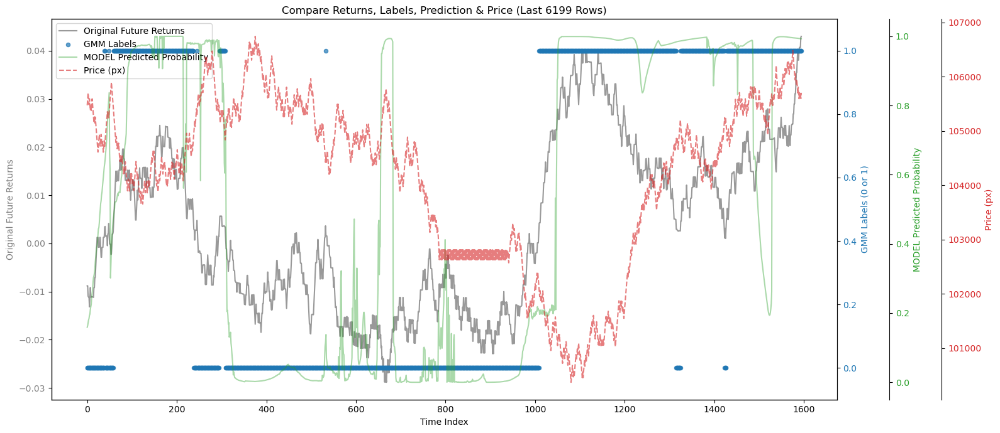

C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\Grayman\anaconda3\envs\machine_learning\lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(r


=== tab_inc 评估结果 ===
📊 全样本准确率: 0.9899
✅ 自信预测准确率: 0.9894 (阈值 0.15-0.85)
📈 出手率: 94.95%

🧮 自信预测混淆矩阵:
[[ 0  0]
 [ 1 93]]

📝 分类报告:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       1.00      0.99      0.99        94

    accuracy                           0.99        94
   macro avg       0.50      0.49      0.50        94
weighted avg       1.00      0.99      0.99        94



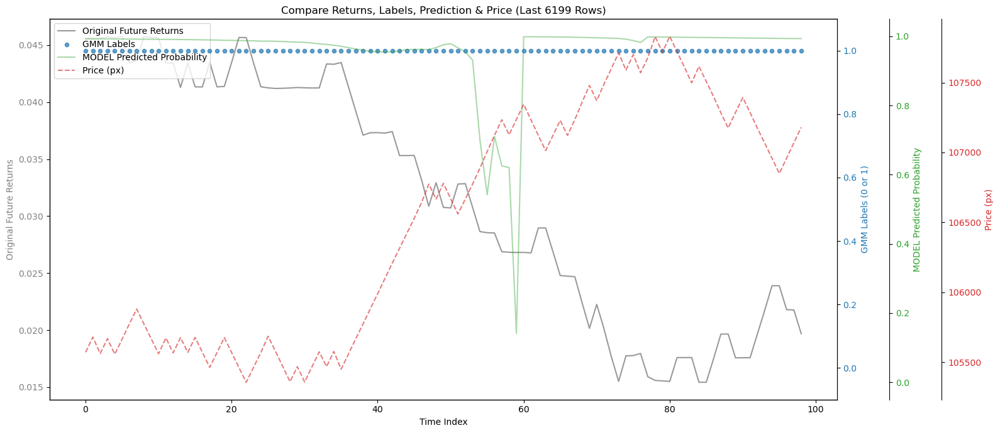

Test Week 8 Evaluation Completed


In [200]:
n_train_weeks = 4 # 可配置
n_val_weeks = 1    # 一般 1 周验证
n_test_weeks = 1   # 后 1 周做 test

exclude_prefixes = ['px', 'timestamp', 'timestamp_dt', 'symbol']
target_col = f"future_return_{avg_steps_pct}"
feature_cols = [
    col for col in origin_df.columns
    if col.endswith("_scaled") 
        # and (col.startswith("z_") or col.startswith("raw_")) 
        and all(not col.startswith(prefix) for prefix in exclude_prefixes)
        and not col.startswith("future_return_")
        and col != "px"
]
# feature_cols = ["z_oi_di_scaled"]
results = []

tab_inc = None
tab_inc_flag = 0

for i in range(len(weekly_dataframes) - n_train_weeks - n_val_weeks - n_test_weeks + 1):
    train_dfs = weekly_dataframes[i : i + n_train_weeks]
    val_dfs = weekly_dataframes[i + n_train_weeks : i + n_train_weeks + n_val_weeks]
    test_dfs = weekly_dataframes[i + n_train_weeks + n_val_weeks : i + n_train_weeks + n_val_weeks + n_test_weeks]
    
    train_df = pl.concat(train_dfs)
    val_df = pl.concat(val_dfs)
    test_df = pl.concat(test_dfs)

    print("=" * 60)
    print(f"Fold {i}: Train {i}~{i+n_train_weeks-1}, Val {i+n_train_weeks}, Test {i+n_train_weeks+1}")
    print("Train:", train_df['timestamp_dt'][0], "to", train_df['timestamp_dt'][-1])
    print("Val:", val_df['timestamp_dt'][0], "to", val_df['timestamp_dt'][-1])
    print("Test:", test_df['timestamp_dt'][0], "to", test_df['timestamp_dt'][-1])
    
    # 处理 train
    train_df_processed = train_df.sort('timestamp').drop_nulls(subset=feature_cols + [target_col, 'px']).to_pandas()
    X_train = train_df_processed[feature_cols]
    y_train = train_df_processed[target_col]
    px_train = train_df_processed['px']

    # 处理 val
    val_df_processed = val_df.sort('timestamp').drop_nulls(subset=feature_cols + [target_col, 'px']).to_pandas()
    X_val = val_df_processed[feature_cols]
    y_val = val_df_processed[target_col]
    px_val = val_df_processed['px']

    # 处理 test
    test_df_processed = test_df.sort('timestamp').drop_nulls(subset=feature_cols + [target_col, 'px']).to_pandas()
    X_test = test_df_processed[feature_cols]
    y_test = test_df_processed[target_col]
    px_test = test_df_processed['px']
    
    
    y_train_bin, y_val_bin, y_test_bin, gmm_model = gmm_label_binarize(y_train, y_val, y_test, verbose=True)

    # modellllllll
    up_thresh = 0.15
    lower_thresh = 0.85
    
    # #LGBM
    lgb_model = lgb.LGBMClassifier(n_estimators=2000, learning_rate=0.005, max_depth=9, verbose=-1)
    lgb_model.fit(
        X_train, y_train_bin,
        eval_set=[(X_val, y_val_bin)],
        eval_metric='binary_logloss',
    )
    
    lgb_eval = evaluate_with_confidence(
        y_true=y_val_bin,
        y_pred_proba=lgb_model.predict_proba(X_val)[:, 1],
        model_name="lgb_model",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_val, y_val_bin, lgb_model.predict_proba(X_val)[:, 1], px_val, n=6199)
    
    lgb_eval = evaluate_with_confidence(
        y_true=y_test_bin,
        y_pred_proba=lgb_model.predict_proba(X_test)[:, 1],
        model_name="lgb_model",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_test, y_test_bin, lgb_model.predict_proba(X_test)[:, 1], px_test, n=6199)


    # # CAT
    # cat_model = CatBoostClassifier(iterations=2000, learning_rate=0.005, depth=9, verbose=0)
    # cat_model.fit(
    #     X_train, y_train_bin,
    # )

    # cat_eval = evaluate_with_confidence(
    #     y_true=y_val_bin,
    #     y_pred_proba=cat_model.predict_proba(X_val)[:, 1],
    #     model_name="cat_model",
    #     lower_thresh=up_thresh,
    #     upper_thresh=lower_thresh,
    #     print_report=True,
    # )
    # plot_last_n_rows_with_px(y_val, y_val_bin, cat_model.predict_proba(X_val)[:, 1], px_val, n=6199)
    
    # cat_eval = evaluate_with_confidence(
    #     y_true=y_test_bin,
    #     y_pred_proba=cat_model.predict_proba(X_test)[:, 1],
    #     model_name="cat_model",
    #     lower_thresh=up_thresh,
    #     upper_thresh=lower_thresh,
    #     print_report=True,
    # )
    # plot_last_n_rows_with_px(y_test, y_test_bin, cat_model.predict_proba(X_test)[:, 1], px_test, n=6199)

    # XGB
    xgb_model = xgb.XGBClassifier(n_estimators=2000, learning_rate=0.005, max_depth=9, verbosity=0, use_label_encoder=False)
    xgb_model.fit(
        X_train, y_train_bin,
    )

    xgb_eval = evaluate_with_confidence(
        y_true=y_val_bin,
        y_pred_proba=xgb_model.predict_proba(X_val)[:, 1],
        model_name="xgb_model",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_val, y_val_bin, xgb_model.predict_proba(X_val)[:, 1], px_val, n=6199)
    

    xgb_eval = evaluate_with_confidence(
        y_true=y_test_bin,
        y_pred_proba=xgb_model.predict_proba(X_test)[:, 1],
        model_name="xgb_model",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_test, y_test_bin, xgb_model.predict_proba(X_test)[:, 1], px_test, n=6199)

    
    # Label Encode y（如果是0/1就不用）
    y_train_enc = y_train_bin.astype(int)
    y_val_enc = y_val_bin.astype(int)
    
    # TabNet 训练
    tabnet = TabNetClassifier(
        n_d=16,
        n_a=16,
        n_steps=7,
        device_name='cuda' if torch.cuda.is_available() else 'cpu',
        verbose=1,
    )
    tabnet.fit(
        X_train=X_train.values, y_train=y_train_enc,
        eval_set=[(X_val.values, y_val_enc)],
        eval_metric=['accuracy'],
        max_epochs=300,
        patience=30,
        batch_size=512,
        virtual_batch_size=256,
    )

    tabnet_eval = evaluate_with_confidence(
        y_true=y_val_bin,
        y_pred_proba=tabnet.predict_proba(X_val.values)[:, 1],
        model_name="tabnet",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_val, y_val_bin, tabnet.predict_proba(X_val.values)[:, 1], px_val, n=6199)


    tabnet_eval = evaluate_with_confidence(
        y_true=y_test_bin,
        y_pred_proba=tabnet.predict_proba(X_test.values)[:, 1],
        model_name="tabnet",
        lower_thresh=up_thresh,
        upper_thresh=lower_thresh,
        print_report=True,
    )
    plot_last_n_rows_with_px(y_test, y_test_bin, tabnet.predict_proba(X_test.values)[:, 1], px_test, n=6199)


    # TabNet_incremental 训练
    if tab_inc_flag == 0:
        tab_inc_flag = 1
        tab_inc = TabNetClassifier(
            n_d=16,
            n_a=16,
            n_steps=7,
            device_name='cuda' if torch.cuda.is_available() else 'cpu',
            verbose=1,
        )
        tab_inc.fit(
            X_train=X_train.values, y_train=y_train_enc,
            eval_set=[(X_val.values, y_val_enc)],
            eval_metric=['accuracy'],
            max_epochs=300,
            patience=30,
            batch_size=512,
            virtual_batch_size=256,
        )
    
        tabnet_eval = evaluate_with_confidence(
            y_true=y_val_bin,
            y_pred_proba=tab_inc.predict_proba(X_val.values)[:, 1],
            model_name="tab_inc",
            lower_thresh=up_thresh,
            upper_thresh=lower_thresh,
            print_report=True,
        )
        plot_last_n_rows_with_px(y_val, y_val_bin, tab_inc.predict_proba(X_val.values)[:, 1], px_val, n=6199)
    
    
        tabnet_eval = evaluate_with_confidence(
            y_true=y_test_bin,
            y_pred_proba=tabnet.predict_proba(X_test.values)[:, 1],
            model_name="tab_inc",
            lower_thresh=up_thresh,
            upper_thresh=lower_thresh,
            print_report=True,
        )
        plot_last_n_rows_with_px(y_test, y_test_bin, tab_inc.predict_proba(X_test.values)[:, 1], px_test, n=6199)
        tab_inc.fit(X_val.values, y_val_enc, warm_start=True)

    else:
        tab_inc.fit(X_val.values, y_val_enc, warm_start=True)
        
        tabnet_eval = evaluate_with_confidence(
            y_true=y_val_bin,
            y_pred_proba=tab_inc.predict_proba(X_val.values)[:, 1],
            model_name="tab_inc",
            lower_thresh=up_thresh,
            upper_thresh=lower_thresh,
            print_report=True,
        )
        plot_last_n_rows_with_px(y_val, y_val_bin, tab_inc.predict_proba(X_val.values)[:, 1], px_val, n=6199)
    
    
        tabnet_eval = evaluate_with_confidence(
            y_true=y_test_bin,
            y_pred_proba=tab_inc.predict_proba(X_test.values)[:, 1],
            model_name="tab_inc",
            lower_thresh=up_thresh,
            upper_thresh=lower_thresh,
            print_report=True,
        )
        plot_last_n_rows_with_px(y_test, y_test_bin, tab_inc.predict_proba(X_test.values)[:, 1], px_test, n=6199)
    
    week_results = {
        'train_period': f"{train_df['timestamp_dt'][0]} to {train_df['timestamp_dt'][-1]}",
        'test_period': f"{test_df['timestamp_dt'][0]} to {test_df['timestamp_dt'][-1]}",
        'LGBM': lgb_eval,
        # 'CatBoost': cat_model,
        'XGBoost': xgb_eval,
        'TabNet': tabnet_eval,
    }
    
    results.append(week_results)
    print(f"Test Week {i+n_train_weeks} Evaluation Completed")

    

In [201]:
import lightgbm as lgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# 示例数据
X = pd.DataFrame(np.random.randn(10000, 20), columns=[f'feat_{i}' for i in range(20)])
future_return = np.random.normal(0, 0.02, 10000)
y_class = (future_return > 0).astype(int)      # 分类 label
y_reg = future_return                          # 回归 label

X_train, X_test, y_class_train, y_class_test, y_reg_train, y_reg_test = train_test_split(
    X, y_class, y_reg, test_size=0.2, random_state=42)

# 分别建两个模型
clf = lgb.LGBMClassifier(n_estimators=300, max_depth=6)
reg = lgb.LGBMRegressor(n_estimators=300, max_depth=6)

clf.fit(X_train, y_class_train)
reg.fit(X_train, y_reg_train)

# 输出方向 + 强度
direction = clf.predict_proba(X_test)[:, 1]  # 趋势强度
strength = reg.predict(X_test)              # 未来预期收益

# signal = 趋势方向 * 期望收益
final_signal = direction * strength


In [202]:
from lightgbm import LGBMRanker

# 模拟分组（如每天一个 group）
X['group'] = np.random.randint(0, 1000, size=len(X))  # 1000 天的模拟选币
group_data = X.groupby('group').size().values

# 排序目标用 future_return
rank_target = future_return

ranker = LGBMRanker(
    objective='lambdarank',
    metric='ndcg',
    n_estimators=300,
    learning_rate=0.05
)

ranker.fit(
    X.drop(columns='group'), rank_target,
    group=group_data
)

rank_score = ranker.predict(X.drop(columns='group'))


LightGBMError: label should be int type (met 0.024178) for ranking task,
for the gain of label, please set the label_gain parameter